# Удержание активности клиентов интернет-магазина

## Цель проекта

Разработать решение, которое позволит персонализировать предложения постоянным клиентам, чтобы увеличить их покупательскую активность.

## Задачи проекта
1. Промаркировать уровень финансовой активности постоянных покупателей. В компании принято выделять два уровня активности: «снизилась», если клиент стал покупать меньше товаров, и «прежний уровень».
2. Собрать данные по клиентам по следующим группам: 
    - Признаки, которые описывают коммуникацию компании с клиентом.
    - Признаки, которые описывают продуктовое поведение покупателя. Например, какие товары покупает и как часто.
    - Признаки, которые описывают финансовое поведение клиента. Например, сколько тратил в магазине.
    - Признаки, которые описывают поведение покупателя на сайте. Например, как много страниц просматривает и сколько времени проводит на сайте.

   Группы признаков (вместе с целевым) можно представить в виде диаграммы Исикавы.
   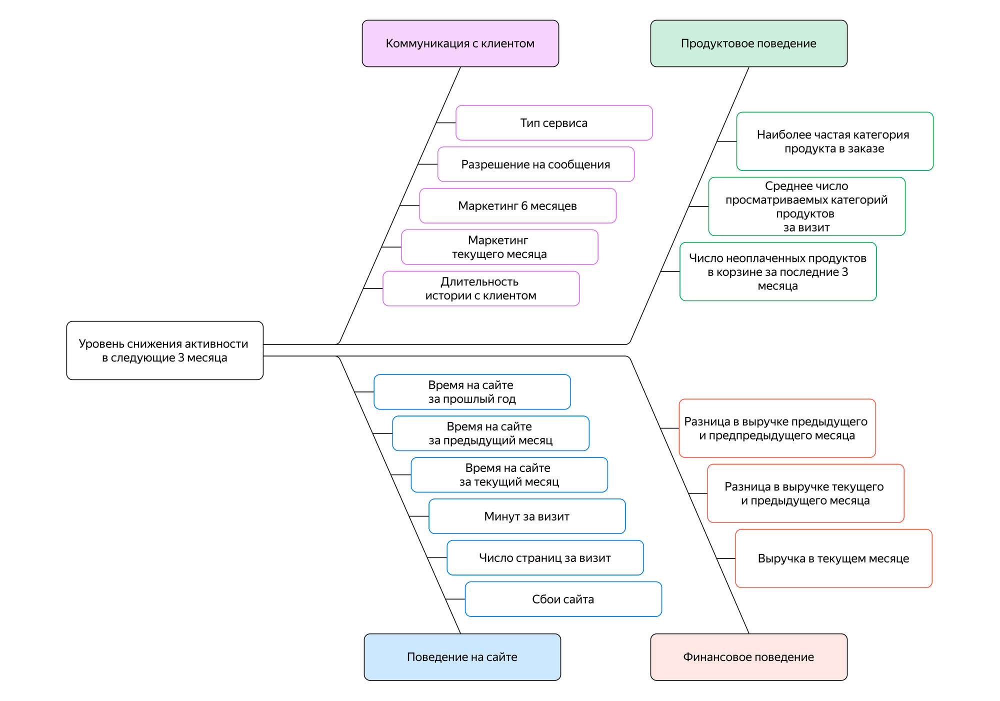
3. Построить модель, которая предскажет вероятность снижения покупательской активности клиента в следующие три месяца.
4. Включить в исследование дополнительные данные финансового департамента о прибыльности клиента: какой доход каждый покупатель приносил компании за последние три месяца.
5. Используя данные модели и данные о прибыльности клиентов, выделить сегменты покупателей и разработать для них персонализированные предложения.

## Описание данных
1. Таблица `market_file.csv` — содержит данные о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении.
    - `id` — номер покупателя в корпоративной базе данных.
    - `Покупательская активность` — рассчитанный класс покупательской активности (целевой признак): «снизилась» или «прежний уровень».
    - `Тип сервиса` — уровень сервиса, например «премиум» и «стандарт».
    - `Разрешить сообщать` — информация о том, можно ли присылать покупателю дополнительные предложения о товаре. Согласие на это даёт покупатель.
    - `Маркет_актив_6_мес` — среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента.
    - `Маркет_актив_тек_мес` — количество маркетинговых коммуникаций в текущем месяце.
    - `Длительность` — значение, которое показывает, сколько дней прошло с момента регистрации покупателя на сайте.
    - `Акционные_покупки` — среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев.
    - `Популярная_категория` — самая популярная категория товаров у покупателя за последние 6 месяцев.
    - `Средний_просмотр_категорий_за_визит` — показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца.
    - `Неоплаченные_продукты_штук_квартал` — общее число неоплаченных товаров в корзине за последние 3 месяца.
    - `Ошибка_сервиса` — число сбоев, которые коснулись покупателя во время посещения сайта.
    - `Страниц_за_визит` — среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца.
2. Таблица `market_money.csv` — содержит данные о выручке, которую получает магазин с покупателя, то есть сколько покупатель всего потратил за период взаимодействия с сайтом.
    - `id` — номер покупателя в корпоративной базе данных.
    - `Период` — название периода, во время которого зафиксирована выручка. Например, 'текущий_месяц' или 'предыдущий_месяц'.
    - `Выручка` — сумма выручки за период.
3. Таблица `market_time.csv` — содержит данные о времени (в минутах), которое покупатель провёл на сайте в течение периода.
    - `id` — номер покупателя в корпоративной базе данных.
    - `Период` — название периода, во время которого зафиксировано общее время.
    - `минут` — значение времени, проведённого на сайте, в минутах.
4. Таблица `money.csv` — содержит данные о среднемесячной прибыли покупателя за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю.
    - `id` — номер покупателя в корпоративной базе данных.
    - `Прибыль` — значение прибыли.

## Установка и обновление библиотек

In [1]:
# обновляем версии библиотек
%pip install scikit-learn==1.2.0 seaborn==0.11.2 matplotlib==3.5.0 -q

# устанавливаем дополнительные библиотеки
%pip install phik shap -q

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


## Импорты

In [2]:
# общие библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# для подсчёта времени вычислений
from time import time

# для расчёта корреляции Фи
import phik

from sklearn.model_selection import (
    train_test_split,  # для разделения выборок
    cross_val_score,  # для оценки метрики при кросс-валидации
    GridSearchCV  # для подбора гиперпараметров моделей
)

# для подготовки данных
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import (
    OneHotEncoder, 
    OrdinalEncoder, 
    StandardScaler, 
    MinMaxScaler
)

# для отбора признаков
from sklearn.feature_selection import (
    SelectKBest,
    f_classif, 
    mutual_info_classif
)

# классы моделей
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

# для построения пайплайна
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# для оценки качества моделей
from sklearn.metrics import roc_auc_score, confusion_matrix

# для оценки важности признаков
from sklearn.inspection import permutation_importance
import shap

## Настройки

In [3]:
# фиксируем случайное состояние для воспроизводимости результатов
RANDOM_STATE = 42

In [4]:
# настройки pandas, чтобы отображать таблицы полностью
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

## Функции

In [5]:
def list_unique_values(data, columns=None):
    """
    Для каждого из указанных столбцов таблицы выводит 
    отсортированный список уникальных значений в этом столбце.
    """
    # если не указаны столбцы, выбираем все
    if columns is None:
        columns = data.columns
    
    # если указан один столбец, преобразуем в список
    if isinstance(columns, str):
        columns = [columns]

    # выводим список уникальных значений в каждом из выбранных столбцов
    for col in columns:
        try:
            print(f'Уникальные значения в столбце \'{col}\':\n'
                  f'{data[col].sort_values().unique().tolist()}')
        except:
            print(f'Столбца {col} не существует.')
        print()

In [6]:
def stat_plots(data, column, target=None):
    """
    Строит графики, характеризующие признак:
    - гистограмму распределения и диаграмму размаха для количественных признаков,
    - столбчатую диаграмму и круговую диаграмму для категориальных признаков,
    с опциональной разбивкой по целевому признаку.
    """
    # если нет такого столбца
    if column not in data.columns:
        print(f"В таблице отсутствует столбец '{column}'")
        return None

    # если признак совпадает с целевым
    if target == column:
        target = None

    # если признак количественный
    if data[column].dtype in ['int64', 'float64']:
        # если признак дискретный
        if data[column].dtype == 'int64' and data[column].nunique() <= 30:
            discrete = True
            kde = False
        else:
            discrete = False
            kde = True
            
        # создаём область построения графиков
        nrows = 2 if target is not None else 1
        fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(10, nrows*4), 
                                 constrained_layout=True, squeeze=False)
        
        # строим гистограмму распределения
        sns.histplot(data=data, x=column, discrete=discrete, 
                     kde=kde, stat='count', 
                     ax=axes[0, 0])
        axes[0, 0].axvline(x=data[column].mean(), color='red', 
                            label='Среднее')
        axes[0, 0].axvline(x=data[column].median(), color='red', 
                            label='Медиана', linestyle='--')
        axes[0, 0].legend()
        axes[0, 0].set_ylabel('Количество')
        axes[0, 0].set_title('Гистограмма распределения (общая)')
        
        # строим диаграмму размаха
        sns.boxplot(data=data, x=column, ax=axes[0, 1])
        axes[0, 1].set_yticklabels([])
        axes[0, 1].set_title('Диаграмма размаха (общая)')

        # если задан целевой признак
        if target is not None:
            # строим гистограмму распределения
            sns.histplot(data=data, x=column, hue=target, discrete=discrete, 
                         kde=kde, stat='probability', common_norm=False, 
                         ax=axes[1, 0])
            axes[1, 0].set_ylabel('Доля')
            axes[1, 0].set_title('Гистограмма распределения (с разбивкой)')
            sns.move_legend(
                axes[1, 0], 'lower center',
                bbox_to_anchor=(0.5, 1.1)
            )
            # строим диаграмму размаха
            sns.boxplot(data=data, x=column, y=target, ax=axes[1, 1])
            axes[1, 1].set_title('Диаграмма размаха (с разбивкой)')

    # если признак категориальный
    elif data[column].dtype in ['object', 'category']:     
        # данные для построения столбчатой диаграммы
        plot_data_ = (
            data
            .pivot_table(index=column, columns=target, values=data.columns[0], aggfunc='count')
        )
        # сортируем столбцы в сводной таблице
        plot_data_ = plot_data_.loc[:, plot_data_.columns.sort_values(ascending=False)]

        # если задан целевой признак и у него больше одного уникального значения
        if target is not None and data[target].nunique() > 1:
            uniq = data[target].unique()
        else:
            uniq = []
        # задаём размер область построения графиков
        nrows = 1 + (len(uniq) + 1) // 2    
        
        # если слишком длинные значения признака, то поворачиваем подписи
        # и увеличиваем высоту диаграммы
        if plot_data_.index.astype('str').str.len().max() > 20: 
            angle = 90
            figwidth = 14
            figheight = nrows*6
        else:
            angle = 0
            figwidth = 10
            figheight = nrows*4

        # создаём область построения графиков
        fig, axes = plt.subplots(nrows=nrows, ncols=2, 
                                 figsize=(figwidth, figheight), 
                                 constrained_layout=True, squeeze=False)
        
        # строим столбчатую диаграмму
        plot_data_.plot(kind='bar', ax=axes[0, 0], rot=angle, stacked=True)
        axes[0, 0].set_ylabel('')
        axes[0, 0].set_title('Количество')

        # добавляем аннотации и настраиваем легенду по разному, 
        # если указан целевой признак или если не указан
        if target is not None:
            # переводим количество в проценты
            percents = plot_data_.transform(lambda x: x / x.sum() * 100, axis=1)
            # добавляем метки со значениями и процентами на график
            for c, col in zip(axes[0, 0].containers, plot_data_.columns):
                vals = percents[col]
                labels = [f'{v.get_height():.0f}\n({val:.1f}%)' if v.get_height() > 0 else '' for v, val in zip(c, vals)]
                axes[0, 0].bar_label(c, labels=labels, label_type='center')
            # оформляем легенду
            sns.move_legend(
                axes[0, 0], 'lower center',
                bbox_to_anchor=(0.5, 1.1)
            )
        else:
            # добавляем метки со значениями на график
            for c in axes[0, 0].containers:
                labels = [f'{v.get_height():.0f}' if v.get_height() > 0 else '' for v in c]
                axes[0, 0].bar_label(c, labels=labels, label_type='center')
            # удаляем легенду
            axes[0, 0].get_legend().remove()
            
        # данные для построения круговых диаграмм
        plot_data = [data[column].value_counts()]  
        # добавляем данные с разбивкой по значению целевого признака
        for u in uniq:
            plot_data.append(
                data
                .loc[data[target] == u, column]
                .value_counts()
                .loc[plot_data[0].index]
            )

        # названия круговых диаграмм
        titles = ['Доля'] + [target + ':\n' + u for u in uniq]
        for i, p_d in enumerate(plot_data):
            # индексы области построения
            r = (i + 1) // 2
            c = (i + 1) % 2
            # строим круговую диаграмму
            p_d.plot(kind='pie', ax=axes[r, c], startangle=90, autopct='%.1f%%',)
            axes[r, c].set_ylabel('')
            axes[r, c].set_title(titles[i])
            
    else:
        print('Неподходящий тип данных аргумента.')

    # заголовок
    fig.suptitle(column)
    
    return fig, axes

In [7]:
def plot_confusion_matrix(y_test, y_pred):
    """
    Строит матрицу ошибок модели классификации.
    """
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
    plt.xlabel('Предсказанное значение')
    plt.ylabel('Истинное значение')
    plt.title('Матрица ошибок модели')

## Загрузка и обзор данных

### Загрузка данных

В файле `money.csv` разделитель — точка с запятой, а разделитель десятичных значений — запятая. 

In [8]:
# загрузка данных из CSV файлов
try:
    market_file = pd.read_csv('/datasets/market_file.csv')
    market_money = pd.read_csv('/datasets/market_money.csv')
    market_time = pd.read_csv('/datasets/market_time.csv')
    money = pd.read_csv('/datasets/money.csv', sep=';', decimal=',')
except:
    try:
        # файлы на локальном компьютере
        market_file = pd.read_csv('datasets/market_file.csv')
        market_money = pd.read_csv('datasets/market_money.csv')
        market_time = pd.read_csv('datasets/market_time.csv')
        money = pd.read_csv('datasets/money.csv', sep=';', decimal=',')
    except:
        # файлы на внешнем сервере
        market_file = pd.read_csv('https://<LINK_REMOVED>/datasets/market_file.csv')
        market_money = pd.read_csv('https://<LINK_REMOVED>/datasets/market_money.csv')
        market_time = pd.read_csv('https://<LINK_REMOVED>/datasets/market_time.csv')
        money = pd.read_csv('https://<LINK_REMOVED>/datasets/money.csv', sep=';', decimal=',')

### Знакомство с данными

#### Таблица market_file

In [9]:
# первые 5 строк таблицы
market_file.head()

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2


In [10]:
# общая информация о таблице
market_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   Покупательская активность            1300 non-null   object 
 2   Тип сервиса                          1300 non-null   object 
 3   Разрешить сообщать                   1300 non-null   object 
 4   Маркет_актив_6_мес                   1300 non-null   float64
 5   Маркет_актив_тек_мес                 1300 non-null   int64  
 6   Длительность                         1300 non-null   int64  
 7   Акционные_покупки                    1300 non-null   float64
 8   Популярная_категория                 1300 non-null   object 
 9   Средний_просмотр_категорий_за_визит  1300 non-null   int64  
 10  Неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 11  Ошибка_сервиса                

#### Таблица market_money

In [11]:
# первые 5 строк таблицы
market_money.head()

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [12]:
# общая информация о таблице
market_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   Период   3900 non-null   object 
 2   Выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB


#### Таблица market_time

In [13]:
# первые 5 строк таблицы
market_time.head()

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


In [14]:
# общая информация о таблице
market_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB


#### Таблица money

In [15]:
# первые 5 строк таблицы
money.head()

,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


In [16]:
# общая информация о таблице
money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   Прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB


### Выводы

Выполнен предварительный обзор данных:
- Таблица `market_file` содержит данные о коммуникации с покупателем, продуктовом поведении покупателя и поведении покупателя на сайте. Дополнительно к признакам, представленным на диаграмме Исикавы, присутствует признак `Акционные_покупки`.
- Таблица `market_money` содержит данные о финансовом поведении покупателя на сайте — значения выручки.
- Таблица `market_time` дополняет данные о поведении покупателя на сайте. Она содержит данные о времени в минутах за месяц, проведённых покупателями на сайте, с указанием периода.
- Таблица `money` содержит дополнительные данные финансового департамента о прибыли, полученной от покупателей. При загрузке таблицы использованы разделитель значений — точка с запятой, разделитель десятичных значений — запятая.

В результате знакомства с данными установлено:
- Названия столбцов во всех таблицах, тип и масштаб значений в них соответствуют описанию данных.
- Явные пропуски (значения `NaN`) отсутствуют во всех таблицах.
- В таблице `market_file` названия трёх столбцов (`Покупательская активность`, `Тип сервиса` и `Разрешить сообщать`) содержат пробелы. Это плохая практика, их лучше заменить на знак подчёркивания. Также лучше привести названия столбцов во всех таблицах к нижнему регистру. Это будет сделано далее на этапе предобработки данных.
- В данных отсутствуют некоторые признаки, характеризующие поведение покупателя на сайте, которые представлены на диаграмме Исикавы: "Время на сайте за прошлый год" и "Минут за визит". 

## Предобработка данных

### Изменение названий столбцов

Заменим пробелы в названиях столбцов в таблице `market_file` на знак подчёркивания и приведём названия столбцов к нижнему регистру.

In [17]:
market_file.columns = (
    market_file.columns
    .str.replace(' ', '_')
    .str.lower()
)
print("Столбцы в таблице 'market_file':\n" , market_file.columns.tolist())

Столбцы в таблице 'market_file':
 ['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки', 'популярная_категория', 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит']


 Приведём названия столбцов в остальных таблицах к нижнему регистру.

In [18]:
for table_name in ['market_money', 'market_time', 'money']:
    table = eval(table_name)
    table.columns = table.columns.str.lower()
    print(f"Столбцы в таблице '{table_name}':\n{table.columns.tolist()}")
    print()

Столбцы в таблице 'market_money':
['id', 'период', 'выручка']

Столбцы в таблице 'market_time':
['id', 'период', 'минут']

Столбцы в таблице 'money':
['id', 'прибыль']



### Обработка пропусков и дубликатов

На этапе знакомства с данными было установлено:
- Типы данных в столбцах всех таблиц соответствуют характеру значений в них.
- Пропущенные значения в данных отсутствуют. Однако могут быть еще неявные пропуски — значения-заполнители (плейсхолдеры). 

Для проверки данных на **неявные пропуски**  и **неявные дубликаты** исследуем уникальные значения категориальных признаков.

Для вывода списка уникальных значений в интересующих столбцах `columns` таблицы `data` используем функцию `list_unique_values(data, columns)`.

#### Таблица market_file

In [19]:
# уникальные значения в столбцах таблицы,
# содержащих категориальные признаки
list_unique_values(market_file.select_dtypes(include = 'object'))

Уникальные значения в столбце 'покупательская_активность':
['Прежний уровень', 'Снизилась']

Уникальные значения в столбце 'тип_сервиса':
['премиум', 'стандарт', 'стандартт']

Уникальные значения в столбце 'разрешить_сообщать':
['да', 'нет']

Уникальные значения в столбце 'популярная_категория':
['Домашний текстиль', 'Косметика и аксесуары', 'Кухонная посуда', 'Мелкая бытовая техника и электроника', 'Техника для красоты и здоровья', 'Товары для детей']



В столбце `Тип сервиса` обнаружены неявные дубликаты — значения `'стандарт'` и `'стандартт'` (это опечатка - лишняя буква "т" в конце). 

Заменим значение с опечаткой на корректное — `'стандарт'`.

In [20]:
market_file['тип_сервиса'] = market_file['тип_сервиса'].replace('стандартт', 'стандарт')
list_unique_values(market_file, 'тип_сервиса')

Уникальные значения в столбце 'тип_сервиса':
['премиум', 'стандарт']



Также исправим опечатку в слове "аксессуары" в названии категории "Косметика и аксессуары".

In [21]:
market_file['популярная_категория'] = market_file['популярная_категория'].replace(
    'Косметика и аксесуары', 'Косметика и аксессуары')

3 из 4 категориальных признаков в таблице — бинарные: `покупательская_активность` (Прежний уровень/Снизилась), `тип_сервиса` (стандарт/премиум), `разрешить_сообщать` (да/нет). Признак `популярная_категория` принимает одно из 6 значений.

Проверим уникальность всех значений id покупателя в таблице и, таким образом, наличие дубликатов. Для этого убедимся, что количество уникальных id совпадает с числом записей в таблице.

In [22]:
# проверяем, что количество уникальных id равно числу строк в таблице
market_file['id'].nunique() == len(market_file)

True

Дубликаты id отсутствуют.

#### Таблица market_money

In [23]:
# уникальные значения в столбцах таблицы,
# содержащих категориальные признаки
list_unique_values(market_money.select_dtypes(include = 'object'))

Уникальные значения в столбце 'период':
['предыдущий_месяц', 'препредыдущий_месяц', 'текущий_месяц']



Обнаружена опечатка: `'препредыдущий_месяц'` вместо правильного `'предпредыдущий_месяц'`. Исправим её.

In [24]:
market_money['период'] = market_money['период'].replace('препредыдущий_месяц', 'предпредыдущий_месяц')
list_unique_values(market_money, 'период')

Уникальные значения в столбце 'период':
['предпредыдущий_месяц', 'предыдущий_месяц', 'текущий_месяц']



In [25]:
# количество строк-дубликатов
market_money.duplicated().sum()

0

Дубликаты записей в таблице отсутствуют.

#### Таблица market_time

In [26]:
# уникальные значения в столбцах таблицы,
# содержащих категориальные признаки
list_unique_values(market_time.select_dtypes(include = 'object'))

Уникальные значения в столбце 'период':
['предыдцщий_месяц', 'текущий_месяц']



Обнаружена опечатка: `'предыдцщий_месяц'` вместо правильного `'предыдущий_месяц'`. Исправим её.

In [27]:
market_time['период'] = market_time['период'].replace('предыдцщий_месяц', 'предыдущий_месяц')
list_unique_values(market_time, 'период')

Уникальные значения в столбце 'период':
['предыдущий_месяц', 'текущий_месяц']



In [28]:
# количество строк-дубликатов
market_time.duplicated().sum()

0

Дубликаты записей в таблице отсутствуют.

#### Таблица money

In [29]:
# количество строк-дубликатов
money.duplicated().sum()

0

Дубликаты записей в таблице отсутствуют.

### Выводы

- В таблице `market_file` в названиях трёх столбцов (`Покупательская активность`, `Тип сервиса` и `Разрешить сообщать` пробелы заменены на знак подчёркивания.
- Названия столбцов во всех таблицах приведены к нижнему регистру.
- В таблице `market_file` устранён неявный дубликат значения `'стандарт'`  в столбце `тип_сервиса` и исправлена опечатка в слове "аксессуары" в названии категории "Косметика и аксессуары" в столбце `популярная_категория`.
- В таблице `market_money` исправлена опечатка в значении `'предпредыдущий_месяц'` в столбце `период`.
- В таблице `market_time` исправлена опечатка в значении `'предыдущий_месяц'` в столбце `период`.
- Строки-дубликаты во всех таблицах отсутствуют.

## Исследовательский анализ данных

Для проверки данных на аномалии исследуем **статистические характеристики количественных признаков** с помощью метода `describe()`.

Кроме того, построим графики, характеризующие признаки в таблицах:
- **Гистограмму распределения и диаграмму размаха для количественных признаков**. На гистограммах для количественных признаков покажем доли от общего количества покупателей с данным значением целевого признака `покупательская_активность`. Диаграммы размаха тоже построим с разбивкой по значению целевого признака. Это позволит увидеть различия в распределении значений количественных признаков в зависимости от значения целевого признака.
- **Столбчатую диаграмму и круговую диаграмму для категориальных признаков**. На столбчатых диаграммах для категориальных признаков покажем разбивку количества покупателей по значению целевого признака. Круговые диаграммы построим для всех данных и отдельно для каждого значения целевого признака.

Для этого используем функцию `stat_plots()`.

### Таблица market_file

In [30]:
# статистические характеристики количественных признаков
market_file.drop(columns='id').describe().T

,count,mean,std,min,25%,50%,75%,max
маркет_актив_6_мес,1300.0,4.253769,1.014814,0.9,3.70,4.20,4.9,6.60
маркет_актив_тек_мес,1300.0,4.011538,0.696868,3.0,4.00,4.00,4.0,5.00
длительность,1300.0,601.898462,249.856289,110.0,405.50,606.00,806.0,1079.00
акционные_покупки,1300.0,0.319808,0.249843,0.0,0.17,0.24,0.3,0.99
средний_просмотр_категорий_за_визит,1300.0,3.270000,1.355350,1.0,2.00,3.00,4.0,6.00
неоплаченные_продукты_штук_квартал,1300.0,2.840000,1.971451,0.0,1.00,3.00,4.0,10.00
ошибка_сервиса,1300.0,4.185385,1.955298,0.0,3.00,4.00,6.0,9.00
страниц_за_визит,1300.0,8.176923,3.978126,1.0,5.00,8.00,11.0,20.00


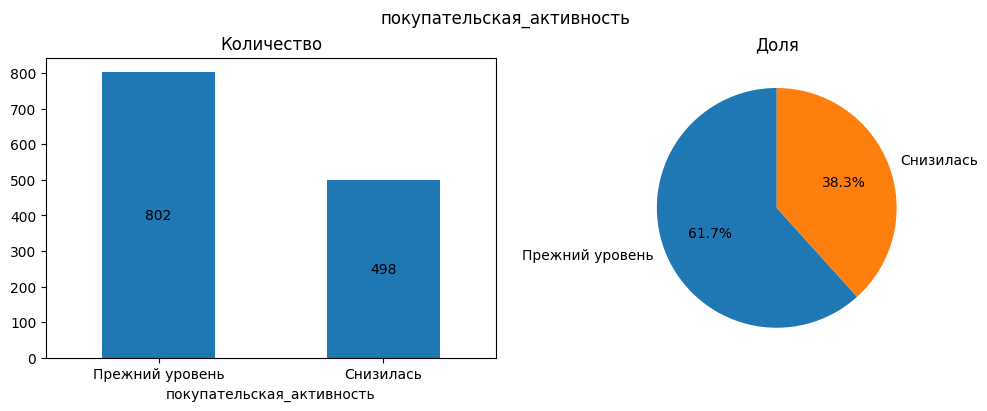

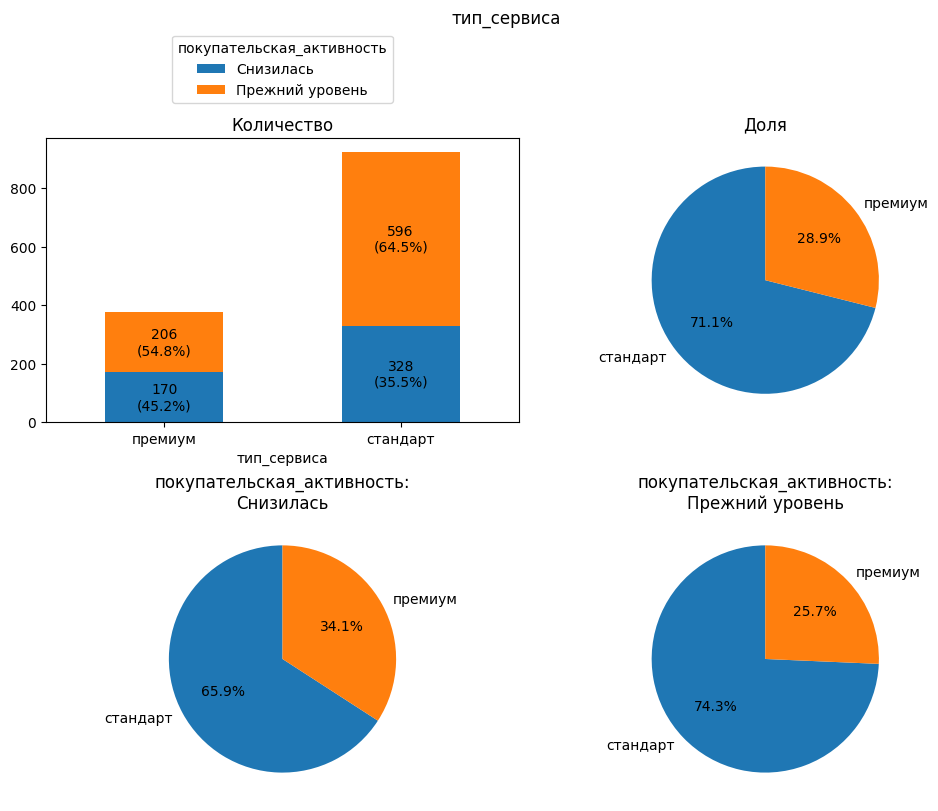

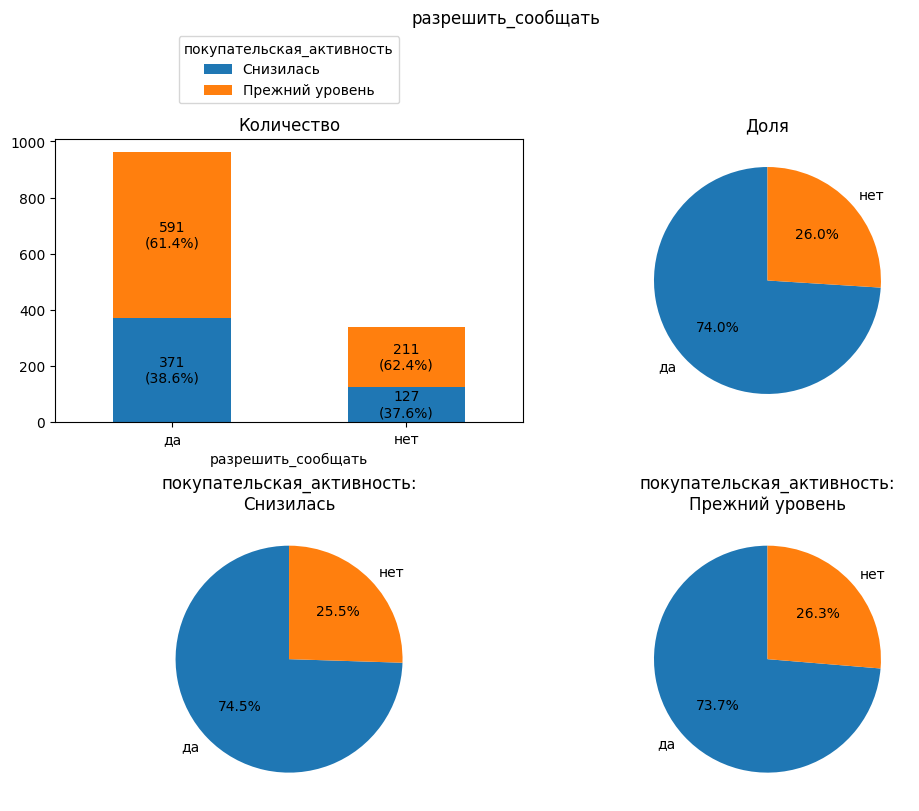

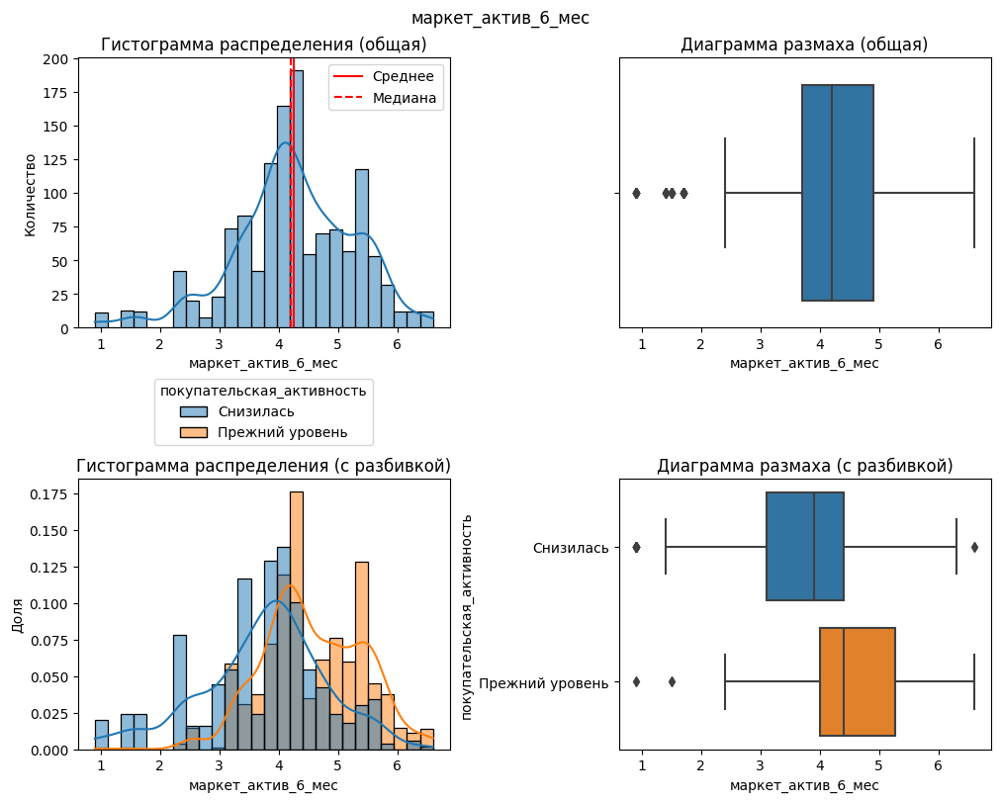

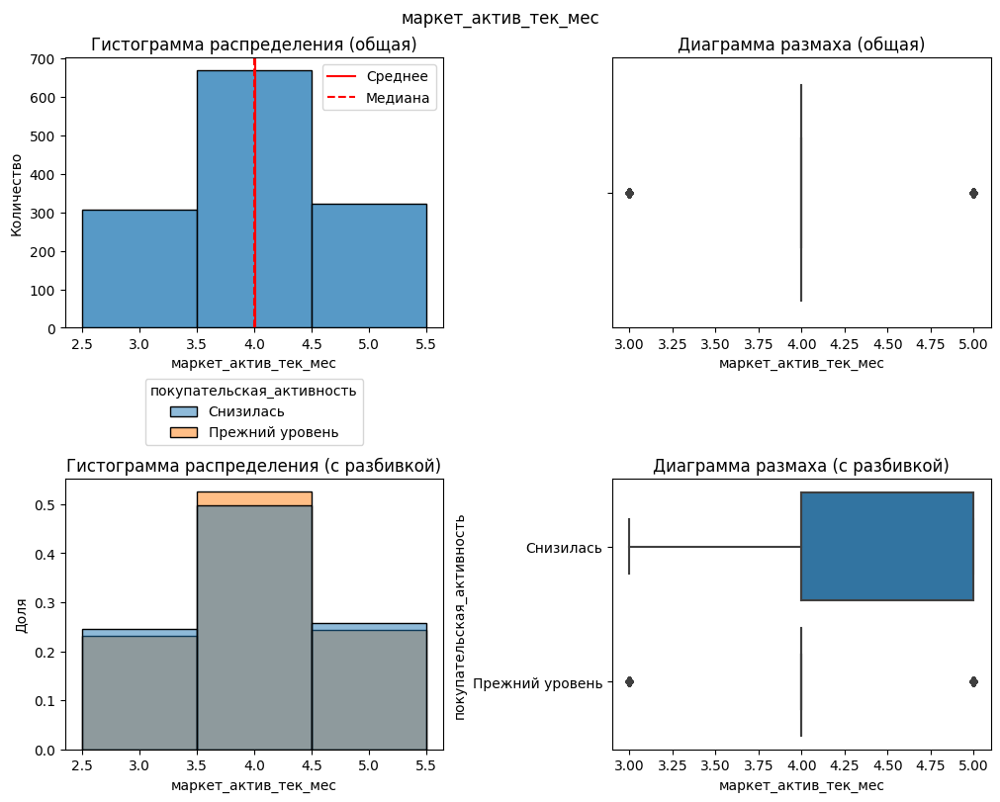

...

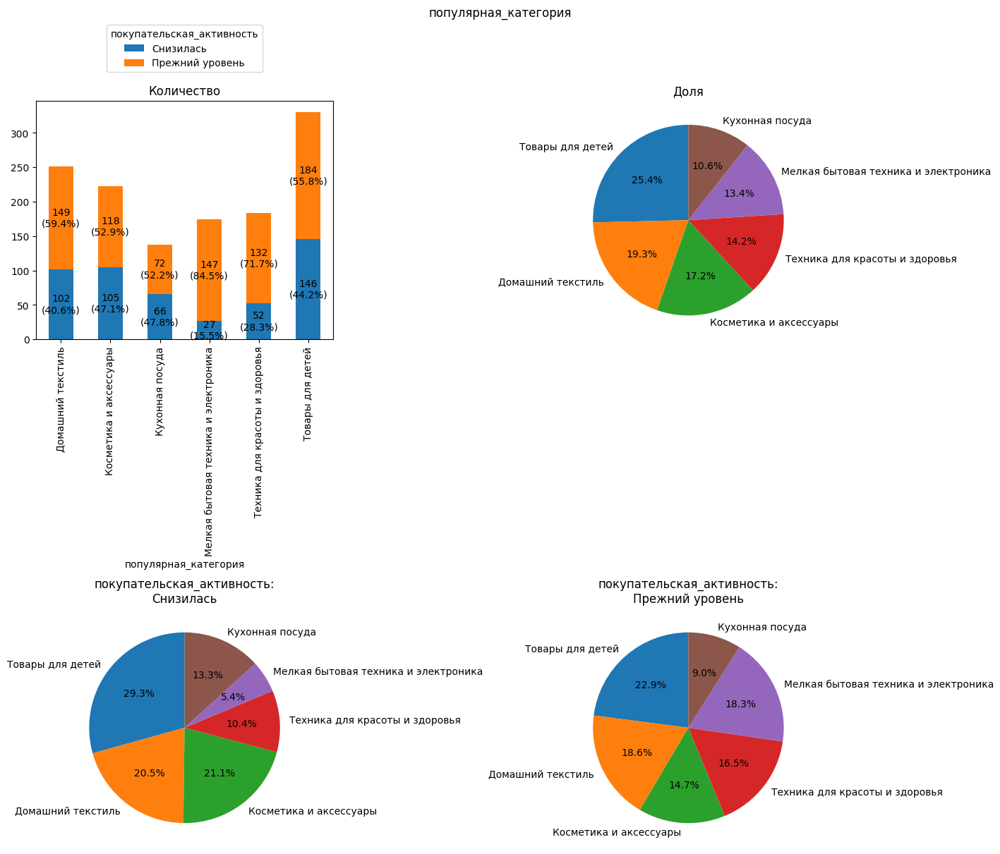

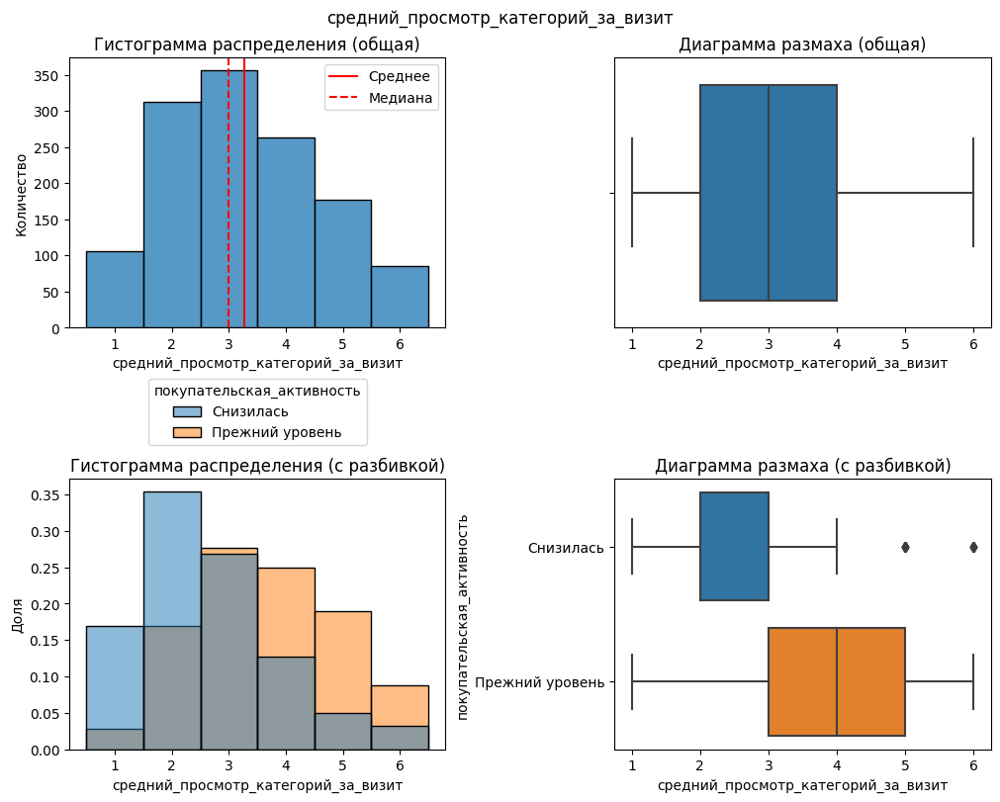

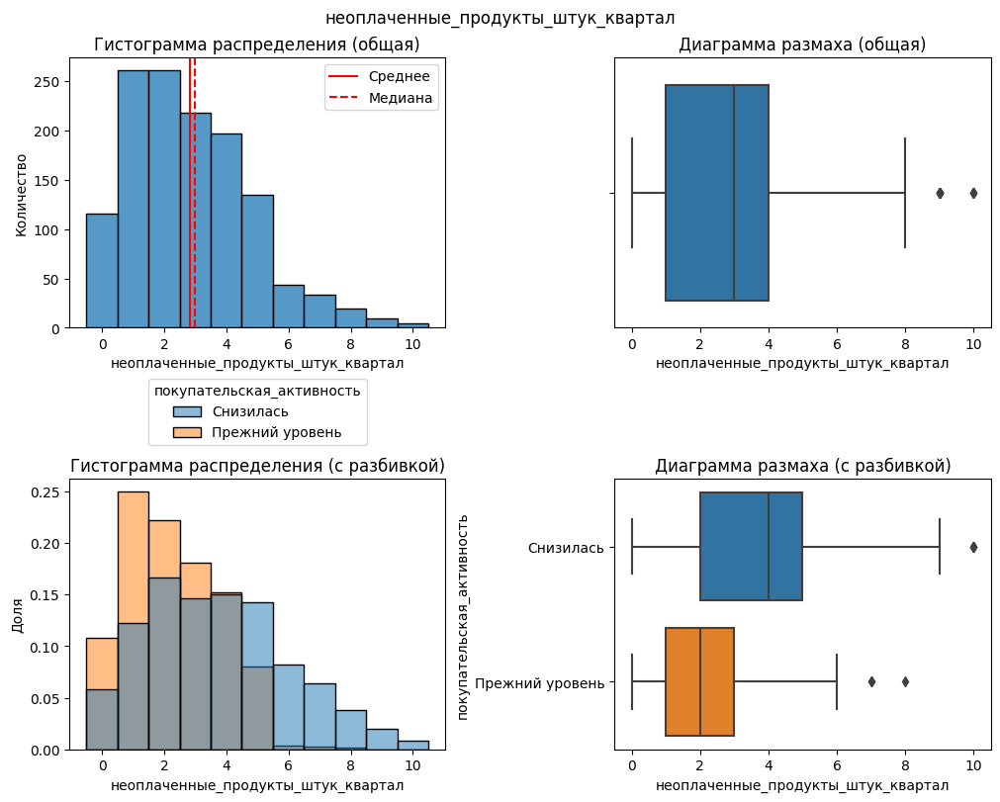

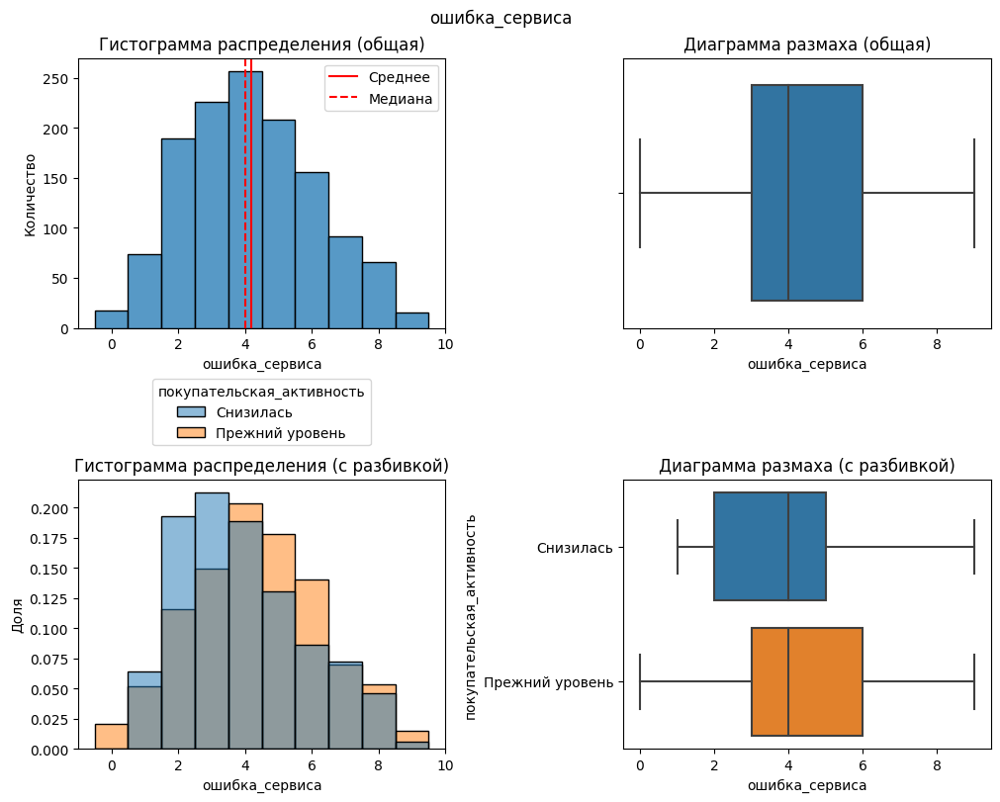

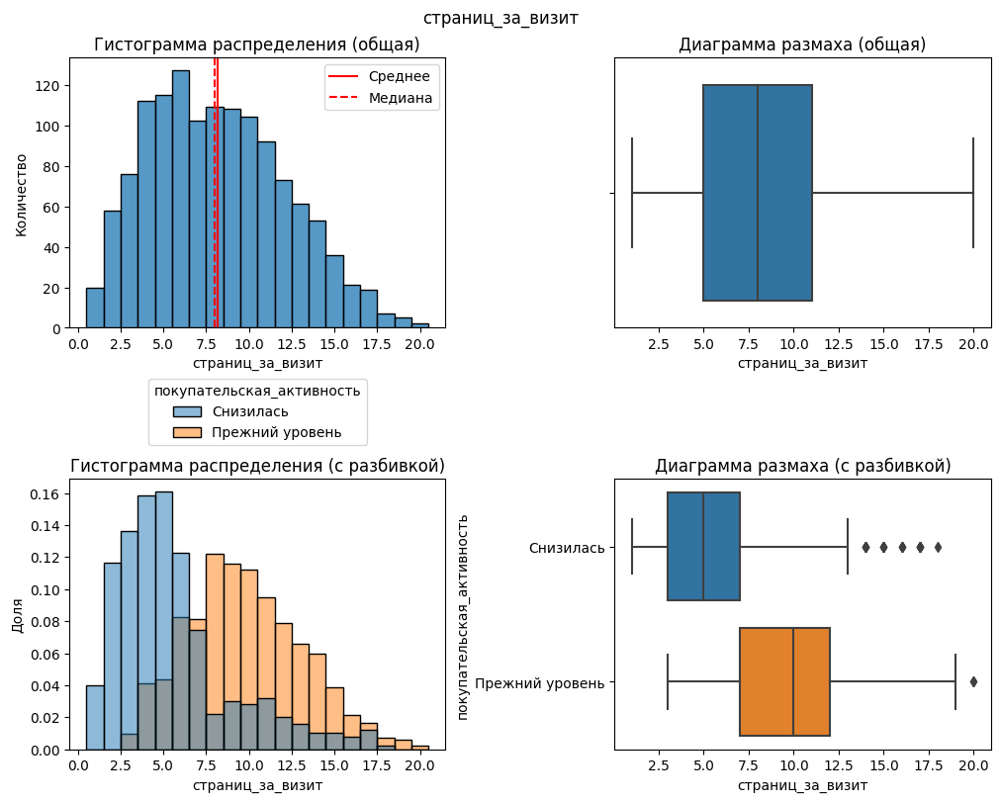

In [31]:
# строим графики для каждого признака в таблице
for feature in market_file.columns.drop('id'):
    stat_plots(market_file, feature, target='покупательская_активность')

- Аномальные значения количественных признаков и редкие значения категориальных признаков не обнаружены.

- Данные не сбалансированы по целевому признаку `покупательская_активность`: ~62% - "Прежний уровень", ~38% - "Снизилась". Но в принципе количество объектов минорного класса (покупателей, у которых снизилась активность) не слишком мало: таких 498 из 1300. Поэтому степень дисбаланса умеренная.

- По типу сервиса ~29% покупателей относится к сегменту "премиум", причём среди тех, у кого снизилась покупательская активность, таких больше - 34%. У премиум-клиентов сильнее снизилась покупательская активность - таких 45% против 35% среди обычных клиентов.

- Разрешение на сообщения дали ~74% покупателей. Заметной разницы в зависимости от уровня покупательской активности нет.

- У большинства покупателей с низким уровнем маркетинговых коммуникаций за последние 6 месяцев активность снизилась. Вероятно, здесь есть причинно-следственная связь: активность выше, если покупатель чаще получает рассылки, видит рекламу.

- За последний месяц количество маркетинговых коммуникаций находилось в диапазоне от 3 до 5, в среднем 4. Таким образом, данный признак имеет низкую вариативность. Влияния на уровень покупательской активности не заметно.

- Распределение покупателей по длительности периода с момента регистрации на сайте близко к равномерному. Судя по распределению, активность сильнее всего снизилась у покупателей со сроком регистрации около 2 лет.

- По доле акционных покупок чётко выделяются 2 сегмента: покупатели с долей покупок по акции менее 0.5 и более 0.8. Снижение активности заметно сильнее среди тех, у кого выше доля акционных покупок. Возможно, это связано с уменьшением количества акций или их привлекательности.

- Популярных категорий 6, их доли сравнимы: от 10% до 25%. Самая популярная категория - "Товары для детей" (~25%). Заметно, что в категориях товаров с длинным жизненным циклом ("Мелкая бытовая техника и электроника" и "Техника для красоты и здоровья") снижение покупательской активности меньше. Сильнее всего активность снизилась у покупателей в категориях "Кухонная посуда" (наименее популярная категория в целом), "Косметика и аксессуары" (3-я по популярности в целом) и "Товары для детей" (самая популярная категория).

- Покупатели, у которых снизилась активность, в среднем за визит на сайт просматривали меньше страниц и категорий товаров. Также у них чаще бывает большое количество неоплаченных товаров в корзине. Вероятно, это связано с различием в поведении сегментов покупателей: активность сильнее снизилась у тех, кто не сидел подолгу на сайте, а держал нужные товары в корзине в ожидании акций.

- Общее количество сбоев сайта, с которыми столкнулся покупатель, не ведёт к снижению его активности. Но если учесть разницу в количестве просмотренных страниц между теми, у кого активность снизилась и осталась на прежнем уровне, то влияние этого фактора на снижение активности вполне возможно. 

### Таблица market_money

Проверим, что в таблице содержатся сведения о тех же самых покупателях, что и в таблице `market_file`.

In [32]:
# проверяем совпадение множеств id в двух таблицах: они должны быть подмножествами друг друга
market_money['id'].isin(market_file['id']).all() and market_file['id'].isin(market_money['id']).all()

True

В таблице `market_money` 3900 записей, относящихся к 1300 покупателей и 3 периодам. Убедимся, что таблица содержит данные о выручке от каждого покупателя за каждый из трёх последних месяцев.

In [33]:
# распределение количества записей по периодам
market_money['период'].value_counts()

предыдущий_месяц        1300
текущий_месяц           1300
предпредыдущий_месяц    1300
Name: период, dtype: int64

In [34]:
# проверяем, что на каждый id приходится по 3 записи
(market_money.groupby('id')['период'].nunique() == 3).all()

True

Для проверки данных на аномалии исследуем статистические характеристики количественных признаков.

In [35]:
# статистические характеристики количественных признаков
market_money.drop(columns='id').describe().T

,count,mean,std,min,25%,50%,75%,max
выручка,3900.0,5025.696051,1777.704104,0.0,4590.15,4957.5,5363.0,106862.2


Кажется подозрительным максимальное значение выручки. Посмотрим, не выбивается ли это значение из ряда прочих.

In [36]:
# выводим 5 строк таблицы в порядке убывания выручки
market_money.sort_values(by='выручка', ascending=False).head()

,id,период,выручка
98,215380,текущий_месяц,106862.2
435,215493,текущий_месяц,7799.4
262,215435,текущий_месяц,7605.3
1481,215841,текущий_месяц,7557.0
2388,216144,текущий_месяц,7547.8


Обнаружена аномалия — чрезвычайно большое значение выручки от одного покупателя за текущий месяц. Посмотрим на данные об этом покупателе в таблице `market_file`.

In [37]:
# данные о покупателе с id = 215380
market_file.query("id == 215380")

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
32,215380,Снизилась,премиум,нет,1.7,4,637,0.94,Техника для красоты и здоровья,3,2,4,7


Другие аномалии, связанные с этим конкретным покупателем, не найдены.

Посмотрим, насколько серьёзна эта аномалия в значении выручки: посчитаем квантиль распределения и отклонение от среднего значения.

In [38]:
# 0.999-квантиль распределения выручки
market_money['выручка'].quantile(0.999)

7548.729200000005

In [39]:
# отклонение от среднего значения в единицах стандартного отклонения
# для 5 значений выручки в порядке убывания 
market_money['выручка'].transform(lambda x: (x - x.mean()) / x.std()).sort_values(ascending=False).head()

98      57.285407
435      1.560273
262      1.451087
1481     1.423917
2388     1.418742
Name: выручка, dtype: float64

Аномальное значение более чем в 10 раз превышает значение 0.999-квантиля и отстоит от среднего более чем на 50 стандартных отклонений, поэтому оставлять в данных его нельзя, а нужно удалить. 

Заменим аномально большое значение на медианное значение выручки остальных покупателей за текущий месяц.

In [40]:
# заменяем на NaN значения выручки больше 8000
market_money['выручка'] = market_money['выручка'].where(market_money['выручка'] < 8000)
# заменяем NaN на медианное значение для текущего месяца
market_money['выручка'] = market_money['выручка'].fillna(
    market_money.loc[market_money['период'] == 'текущий_месяц', 'выручка'].median()
)

Повторно посмотрим на статистические характеристики количественных признаков.

In [41]:
# статистические характеристики количественных признаков
market_money.drop(columns='id').describe().T

,count,mean,std,min,25%,50%,75%,max
выручка,3900.0,4999.62359,706.915088,0.0,4590.15,4957.5,5363.0,7799.4


Посмотрим, как менялась суммарная выручка от всех покупателей по месяцам.

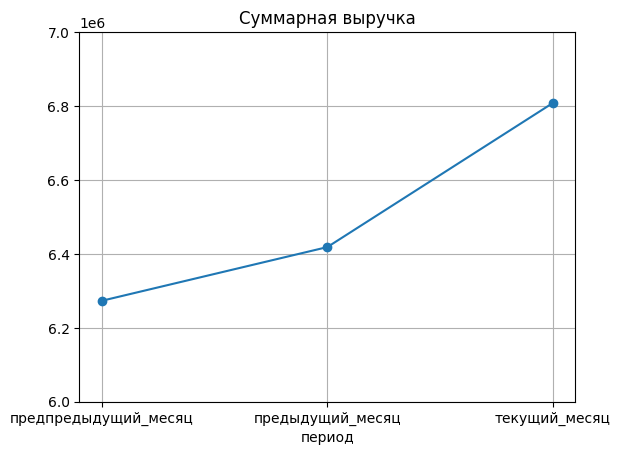

In [42]:
# строим график зависимости суммарной выручки от периода
(market_money
 .groupby('период')
 ['выручка'].sum()
 .plot(style='o-', grid=True)
)
plt.title('Суммарная выручка')
plt.xticks(range(3))
plt.ylim((6e6, 7e6));

В целом дела у магазина идут хорошо — суммарная выручка растёт.

Исследуем распределение покупателей по выручке за весь период трёх последних месяцев и отдельно за каждый месяц.

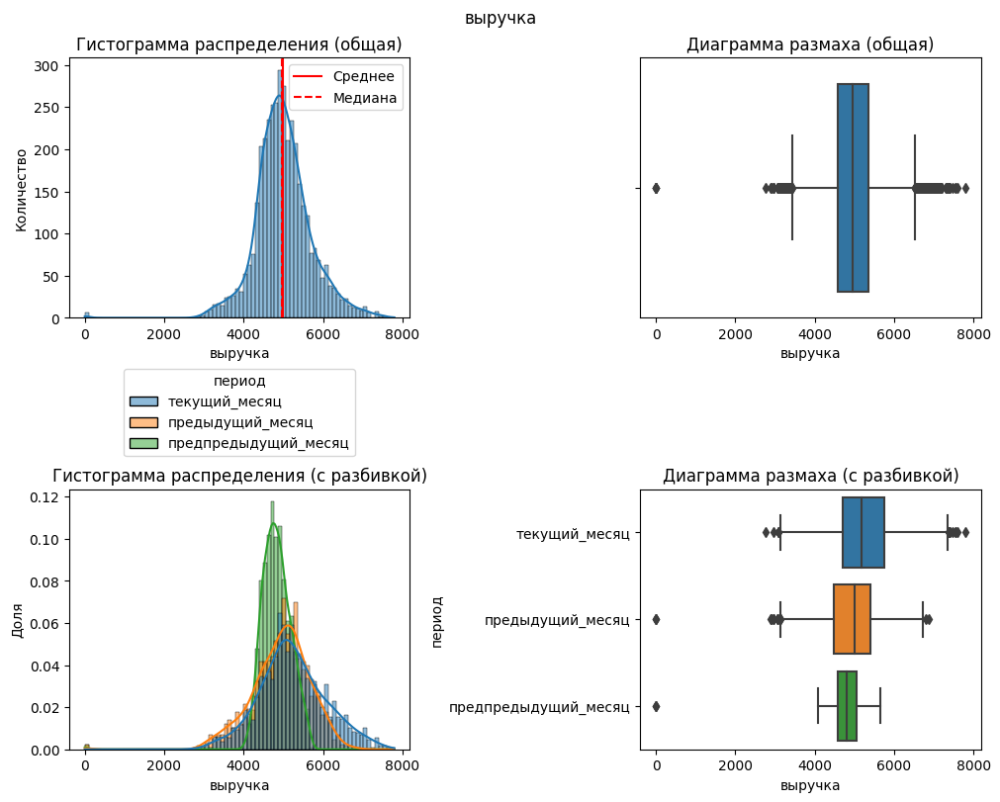

In [43]:
# строим графики
# сортируем данные, чтобы получить логический порядок месяцев
stat_plots(market_money.sort_values(by='период', ascending=False), 'выручка', target='период');

- Распределение покупателей по выручке близко к нормальному. Есть несколько выбросов - покупатели, которые ничего не покупали в предыдущий или предпредыдущий месяц.
- Ширина распределения со временем увеличивается. Это указывает на диверсификацию поведения покупателей. Наиболее заметен рост доли покупателей, приносящих высокую выручку. 

### Таблица market_time

Проверим, что в таблице содержатся сведения о тех же самых покупателях, что и в таблице `market_file`.

In [44]:
# проверяем совпадение множеств id в двух таблицах: они должны быть подмножествами друг друга
market_time['id'].isin(market_file['id']).all() and market_file['id'].isin(market_time['id']).all()

True

В таблице `market_time` 2600 записей, относящихся к 1300 покупателей и 2 периодам. Убедимся, что таблица содержит данные о времени, проведённом на сайте, для каждого покупателя за каждый из двух последних месяцев.

In [45]:
# распределение количества записей по периодам
market_time['период'].value_counts()

предыдущий_месяц    1300
текущий_месяц       1300
Name: период, dtype: int64

In [46]:
# проверяем, что на каждый id приходится по 3 записи
(market_time.groupby('id')['период'].nunique() == 2).all()

True

Для проверки данных на аномалии исследуем статистические характеристики количественных признаков.

In [47]:
# статистические характеристики количественных признаков
market_time.drop(columns='id').describe().T

,count,mean,std,min,25%,50%,75%,max
минут,2600.0,13.336154,4.080198,4.0,10.0,13.0,16.0,23.0


Аномалии в количественных признаках не обнаружены.

Исследуем распределение покупателей по времени, проведённом на сайте, за два последних месяца в целом и отдельно за каждый месяц.

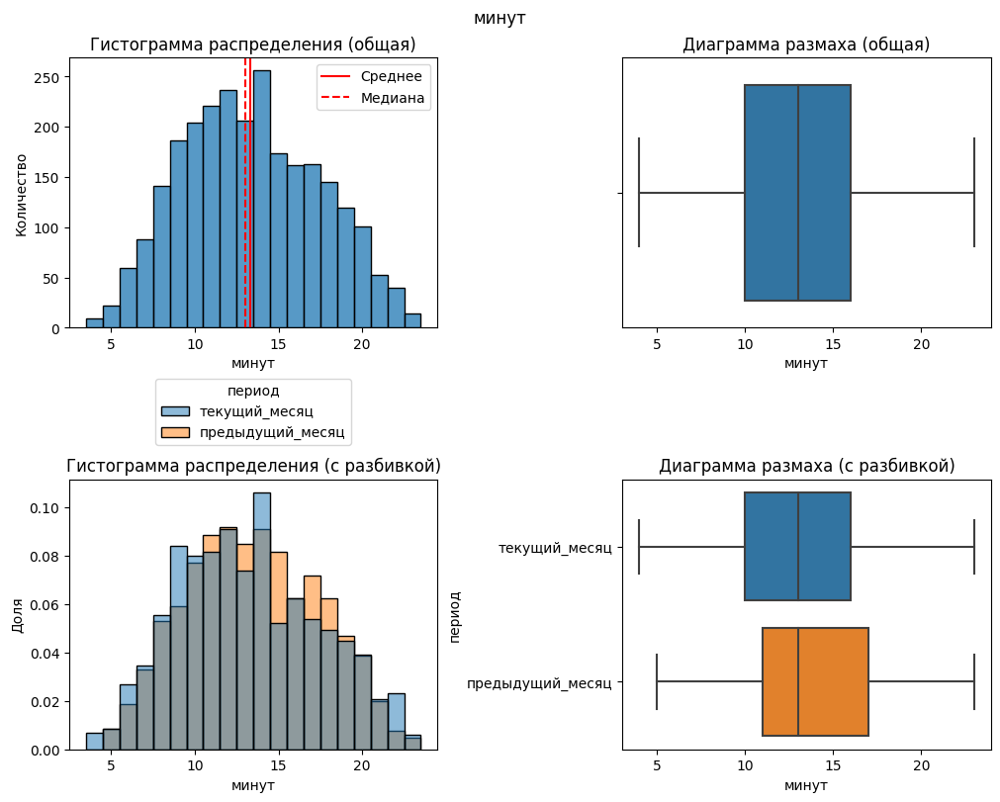

In [48]:
# строим графики
stat_plots(market_time, 'минут', target='период');

- Аномалии в данных не обнаружены.
- Распределение покупателей по времени, проведённом на сайте, похоже на нормальное. Выбросы и хвосты отсутствуют.
- В текущем месяце стала больше доля покупателей, которые провели на сайте за месяц менее 10 минут.

### Таблица money

Проверим, что в таблице содержатся сведения о тех же самых покупателях, что и в таблице `market_file`.

In [49]:
# проверяем совпадение множеств id в двух таблицах: они должны быть подмножествами друг друга
money['id'].isin(market_file['id']).all() and market_file['id'].isin(money['id']).all()

True

Для проверки данных на аномалии исследуем статистические характеристики количественных признаков.

In [50]:
# статистические характеристики количественных признаков
money.drop(columns='id').describe().T

,count,mean,std,min,25%,50%,75%,max
прибыль,1300.0,3.996631,1.013722,0.86,3.3,4.045,4.67,7.43


Исследуем распределение покупателей по прибыльности.

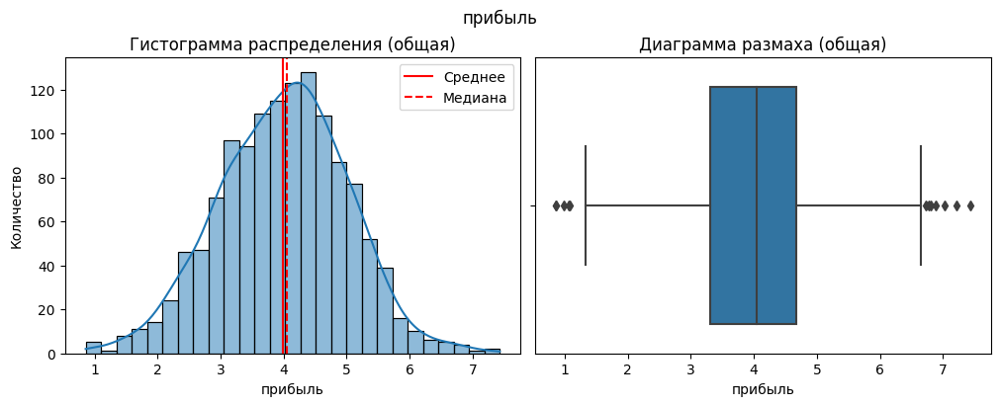

In [51]:
# строим графики
stat_plots(money, 'прибыль');

- Аномалии в данных не обнаружены.
- Распределение покупателей по прибыли похоже на нормальное. Сильные выбросы и длинные хвосты отсутствуют.

### Отбор данных

Отберём покупателей с покупательской активностью не менее трёх месяцев, то есть таких, которые что-либо покупали в каждом из последних 3 месяцев.

In [52]:
# сначала группируем таблицу 'market_money' по 'id' и получаем boolean Series,
# в котором индексы значений True - id, у которых выручка за каждый из 3 месяцев больше 0,
# затем выделяем из таблицы 'market_file' эти id с помощью логической индексации
good_ids = market_file.set_index('id').index[
    market_money.groupby('id')
        .apply(lambda x: x['период'].nunique() == 3 and x['выручка'].min() > 0)]
print('Количество покупателей с активностью в каждом из последних 3 месяцев:', len(good_ids))

Количество покупателей с активностью в каждом из последних 3 месяцев: 1297


Только 3 покупателя из 1300 не делали покупок в каждом из последних 3 месяцев. Далее при объединении данных из трёх таблиц исключим их из дальнейшего рассмотрения.

### Выводы

1. Установлены состав и структура данных:
    - Таблица `market_file` содержит данные о 1300 уникальных покупателях.
    - Таблица `market_money` содержит данные о выручке от каждого из этих покупателей за 3 последних месяца: текущий, предыдущий и предпредыдущий.
    - Таблица `market_time` содержит данные о времени в минутах, которое каждый из этих покупателей провёл на сайте за 2 последних месяца: текущий и предыдущий.
    - Таблица `money` содержит данные о среднемесячной прибыли каждого из этих покупателей за последние 3 месяца.

2. Обнаружен дисбаланс данных по целевому признаку `покупательская_активность`: ~62% - "Прежний уровень", ~38% - "Снизилась". Но в принципе степень дисбаланса умеренная. Данных минорного класса должно быть достаточно для обучения моделей.

3. Обнаружена аномалия в данных о выручке — чрезвычайно большое значение выручки от одного покупателя за текущий месяц. Аномальное значение заменено на медианное значение выручки остальных покупателей за текущий месяц.

4. Установлено, что суммарная выручка магазина на протяжении последних трёх месяцев растёт. При этом ширина распределения  покупателей по выручке со временем увеличивается. Это указывает на диверсификацию поведения покупателей. Наиболее заметен рост доли покупателей, приносящих высокую выручку.

5. Проанализировано распределение покупателей по количественным и категориальным признакам, представленным в данных, с учётом разбивки по значению целевого признака. Выявлены различия в распределениях в зависимости от факта снижения покупательской активности.

    - Покупательская активность сильнее снизилась у премиум-клиентов - таких 45% против 35% среди обычных клиентов.

    - Факт снижения покупательской активности не зависит от разрешения на сообщения.

    - У большинства покупателей с низким уровнем маркетинговых коммуникаций за последние 6 месяцев активность снизилась. Вероятно, здесь есть причинно-следственная связь: активность выше, если покупатель чаще получает рассылки, видит рекламу.

    - Влияния количество маркетинговых коммуникаций за последний месяц на уровень покупательской активности не заметно. Кроме того, признак имеет низкую вариативность. 

    - Снижение активности сильнее всего у покупателей со сроком регистрации около 2 лет.

    - По доле акционных покупок чётко выделяются 2 сегмента: покупатели с долей покупок по акции менее 0.5 и более 0.8. Снижение активности заметно сильнее среди тех, у кого выше доля акционных покупок. Возможно, это связано с уменьшением количества акций или их привлекательности.

    - Сильнее всего активность снизилась у покупателей в категориях "Кухонная посуда" (наименее популярная категория в целом), "Косметика и аксессуары" (3-я по популярности в целом) и "Товары для детей" (самая популярная категория). В категориях товаров с длинным жизненным циклом ("Мелкая бытовая техника и электроника" и "Техника для красоты и здоровья") снижение покупательской активности меньше. 

    - Покупатели, у которых снизилась активность, в среднем за визит на сайт просматривали меньше страниц и категорий товаров. Также у них чаще бывает большое количество неоплаченных товаров в корзине. Вероятно, это связано с различием в поведении сегментов покупателей: активность сильнее снизилась у тех, кто не сидел подолгу на сайте, а держал нужные товары в корзине в ожидании акций.

    - Общее количество сбоев сайта, с которыми столкнулся покупатель, не ведёт к снижению его активности. Но если учесть разницу в количестве просмотренных страниц между теми, у кого активность снизилась и осталась на прежнем уровне, то влияние этого фактора на снижение активности вполне возможно. Возможно, в том числе из-за этого в текущем месяце стала больше доля покупателей, которые провели на сайте за месяц менее 10 минут.

6. Отобраны покупатели с покупательской активностью не менее трёх месяцев, то есть такие, которые что-либо покупали в каждом из последних 3 месяцев.

## Объединение таблиц

### Объединение таблиц

Объединим таблицы `market_file`, `market_money` и `market_time` и оставим только отобранных покупателей с покупательской активностью не менее трёх месяцев.

In [53]:
# формируем объединённую таблицу,
# соединяя таблицу `market_file` по индексу - id покупателя
# со сводными таблицами из данных в таблицах `market_money` и `market_time`
market = (
    # устанавливаем id в качестве индекса
    market_file.set_index('id')
    .join(market_money
          # формируем сводную таблицу с выручкой за каждый период
          .pivot(index='id', columns='период', values='выручка')
          # добавляем префикс к названиям столбцов
          .add_prefix('выручка_')
         )
    .join(market_time
          # формируем сводную таблицу с временем на сайте за каждый период
          .pivot(index='id', columns='период', values='минут')
          # добавляем префикс к названиям столбцов
          .add_prefix('минут_на_сайте_')
         )
    # оставляем только "хорошие" id с покупательской активностью 3 месяца
    .loc[good_ids]
)
# выводим первые 5 строк объединённой таблицы
market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предпредыдущий_месяц,выручка_предыдущий_месяц,выручка_текущий_месяц,минут_на_сайте_предыдущий_месяц,минут_на_сайте_текущий_месяц
id,,,,,,,,,,,,,,,,,
215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4472.0,5216.0,4971.6,12,10
215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,4826.0,5457.5,5058.4,8,13
215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,4793.0,6158.0,6610.4,11,13
215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,4594.0,5807.5,5872.5,8,11
215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,5124.0,4738.5,5388.5,10,10


In [54]:
# общая информация о таблице
market.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1297 entries, 215349 to 216647
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   покупательская_активность            1297 non-null   object 
 1   тип_сервиса                          1297 non-null   object 
 2   разрешить_сообщать                   1297 non-null   object 
 3   маркет_актив_6_мес                   1297 non-null   float64
 4   маркет_актив_тек_мес                 1297 non-null   int64  
 5   длительность                         1297 non-null   int64  
 6   акционные_покупки                    1297 non-null   float64
 7   популярная_категория                 1297 non-null   object 
 8   средний_просмотр_категорий_за_визит  1297 non-null   int64  
 9   неоплаченные_продукты_штук_квартал   1297 non-null   int64  
 10  ошибка_сервиса                       1297 non-null   int64  
 11  страниц_за_визит       

### Добавление новых признаков

Добавим в таблицу новые признаки: `разница_выручки_тек_и_пред_мес` (разница в выручке текущего и предыдущего месяца) и `разница_выручки_пред_и_предпред_мес` (разница в выручке предыдущего и предпредыдущего месяца), которые были показаны на диаграмме Исикавы.

In [55]:
# добавляем в таблицу новые столбцы
market['разница_выручки_тек_и_пред_мес'] = market['выручка_текущий_месяц'] - market['выручка_предыдущий_месяц']
market['разница_выручки_пред_и_предпред_мес'] = market['выручка_предыдущий_месяц'] - market['выручка_предпредыдущий_месяц']

### Выводы

- Таблицы успешно объединены. В объединённой таблице данные о 1297 покупателях, которые совершали покупки в каждом из последних 3 месяцев.
- В таблицу добавлены новые признаки "Разница в выручке текущего и предыдущего месяца" и "Разница в выручке предыдущего и предпредыдущего месяца", представленные на диаграмме Исикавы.

## Корреляционный анализ

### Коэффициенты корреляции

Исследуем степень связи входных признаков друг с другом, чтобы определить характер и силу связи между каждым из входных признаков и целевым признаком, а также проверить входные признаки на мультиколлинеарность. Для этого рассчитаем матрицу корреляции признаков и визуализируем её в виде тепловой карты.

Степень линейной связи между количественными признаками покажет корреляция Пирсона.

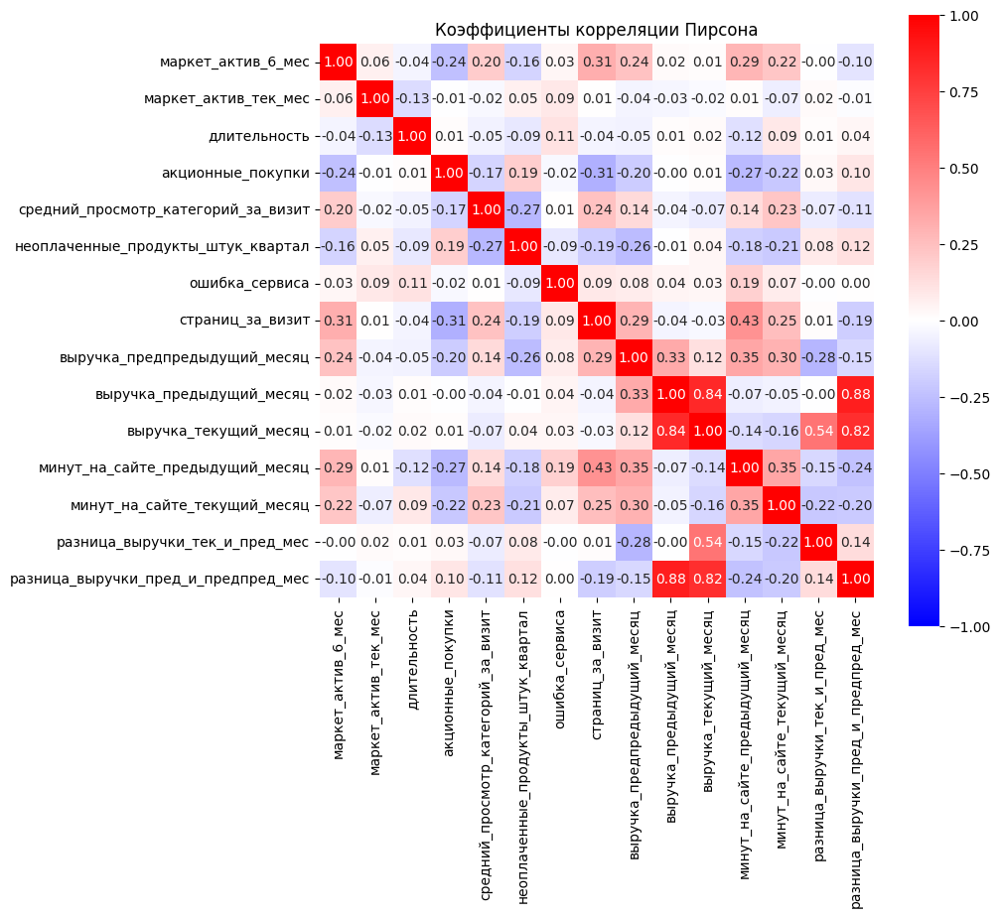

In [56]:
plt.figure(figsize=(9, 8))
sns.heatmap(market.corr(), cmap='bwr', vmin=-1, vmax=1, annot=True, fmt='.2f', square=True)
plt.title('Коэффициенты корреляции Пирсона');

Для признаков, распределение значений которых сильно отличается от нормального, предпочтительнее использовать ранговую корреляцию Спирмена. В рассматриваемых данных такой признак один - `акционные_покупки`. Тем не менее, проверим, сильно ли будут отличаться коэффициенты корреляции, рассчитанные двумя методами.

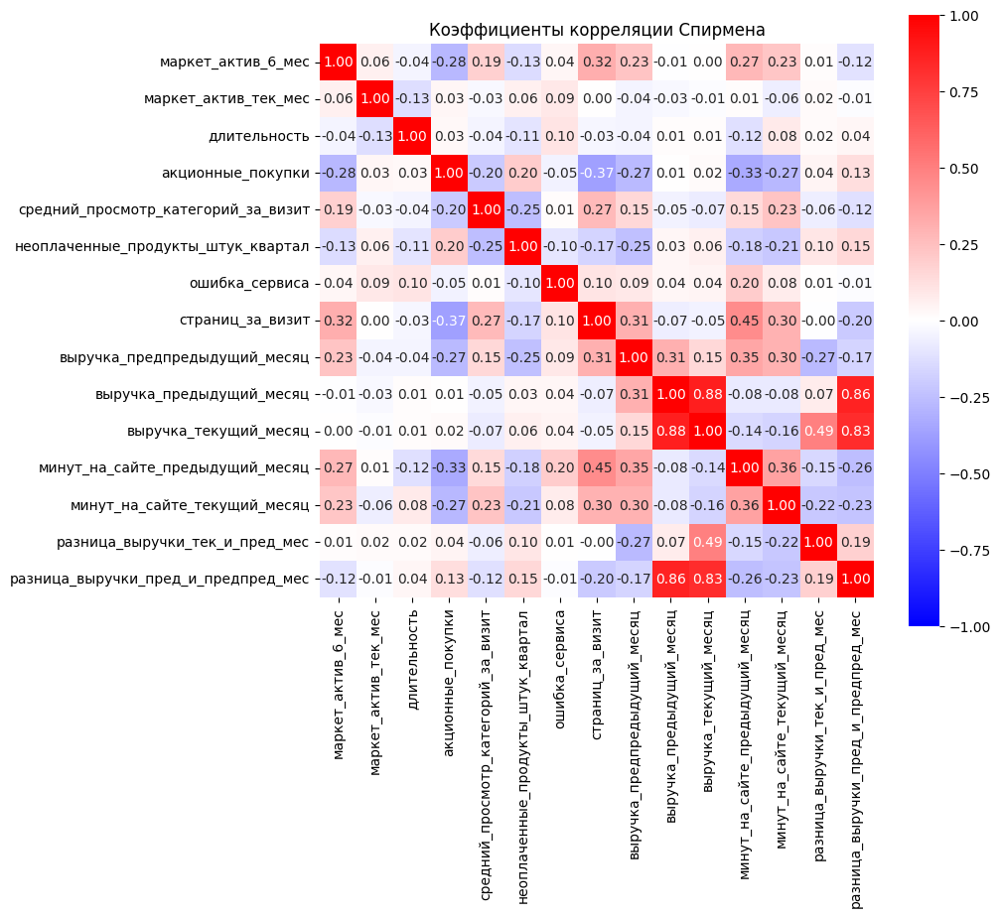

In [57]:
plt.figure(figsize=(9, 8))
sns.heatmap(market.corr(method='spearman'), cmap='bwr', vmin=-1, vmax=1, annot=True, fmt='.2f', square=True)
plt.title('Коэффициенты корреляции Спирмена');

Отличия коэффициентов корреляции Спирмена и Пирсона оказались невелики.

Для анализа связи целевого признака `покупательская_активность` с категориальными признаками (что важно для проверки на утечку целевого признака), а также проверки категориальных признаков на мультиколлинеарность, рассчитаем коэффициенты корреляции фи ($\phi_k$) для всех признаков.

In [58]:
# список количественных признаков
num_features = market.select_dtypes(include='number').columns.drop(['id'], errors='ignore').tolist()
num_features

['маркет_актив_6_мес',
 'маркет_актив_тек_мес',
 'длительность',
 'акционные_покупки',
 'средний_просмотр_категорий_за_визит',
 'неоплаченные_продукты_штук_квартал',
 'ошибка_сервиса',
 'страниц_за_визит',
 'выручка_предпредыдущий_месяц',
 'выручка_предыдущий_месяц',
 'выручка_текущий_месяц',
 'минут_на_сайте_предыдущий_месяц',
 'минут_на_сайте_текущий_месяц',
 'разница_выручки_тек_и_пред_мес',
 'разница_выручки_пред_и_предпред_мес']

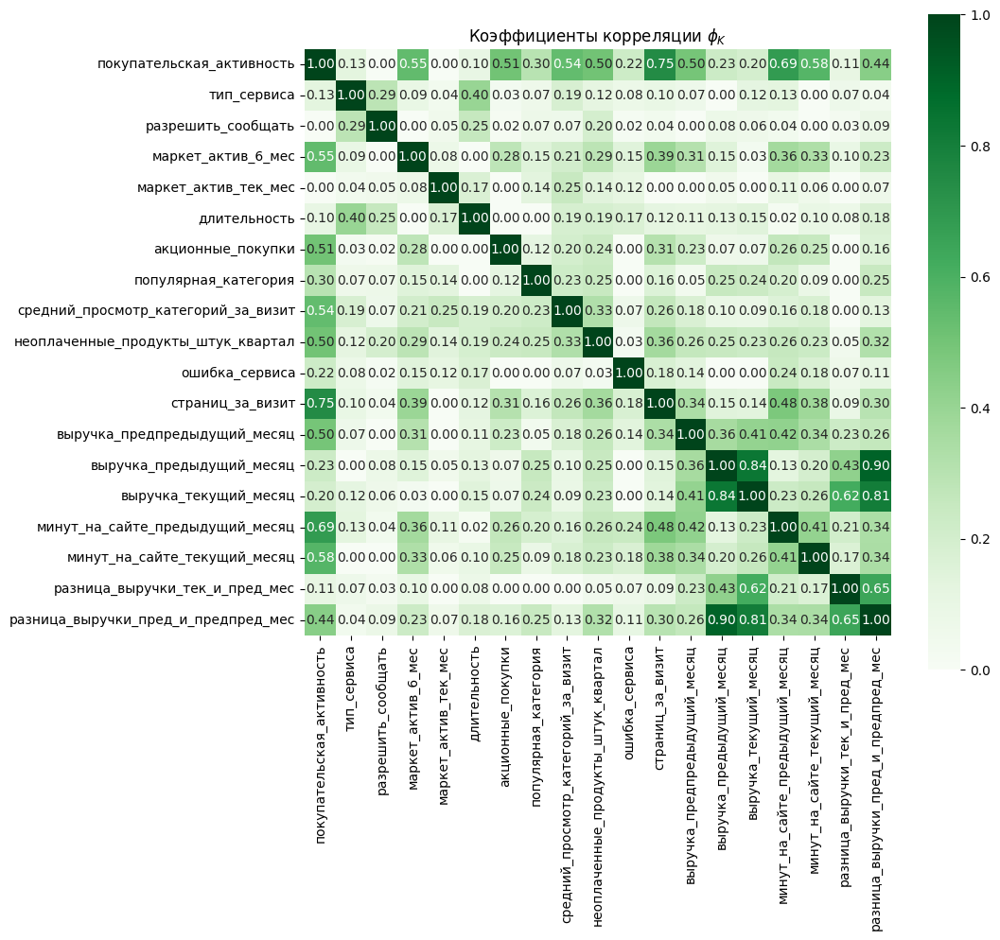

In [59]:
plt.figure(figsize=(10, 9))
sns.heatmap(market.phik_matrix(interval_cols=num_features), cmap='Greens', vmin=0, vmax=1, annot=True, fmt='.2f', square=True)
plt.title('Коэффициенты корреляции $\phi_K$');

### Диаграммы рассеяния

Дополнительно исследуем совместное распределение признаков, построив диаграммы рассеяния для всех пар количественных признаков с учётом значения целевого признака `покупательская_активность`. Признаков в данных много, поэтому рассматривать графики нужно с увеличением (дабл-клик по графику).

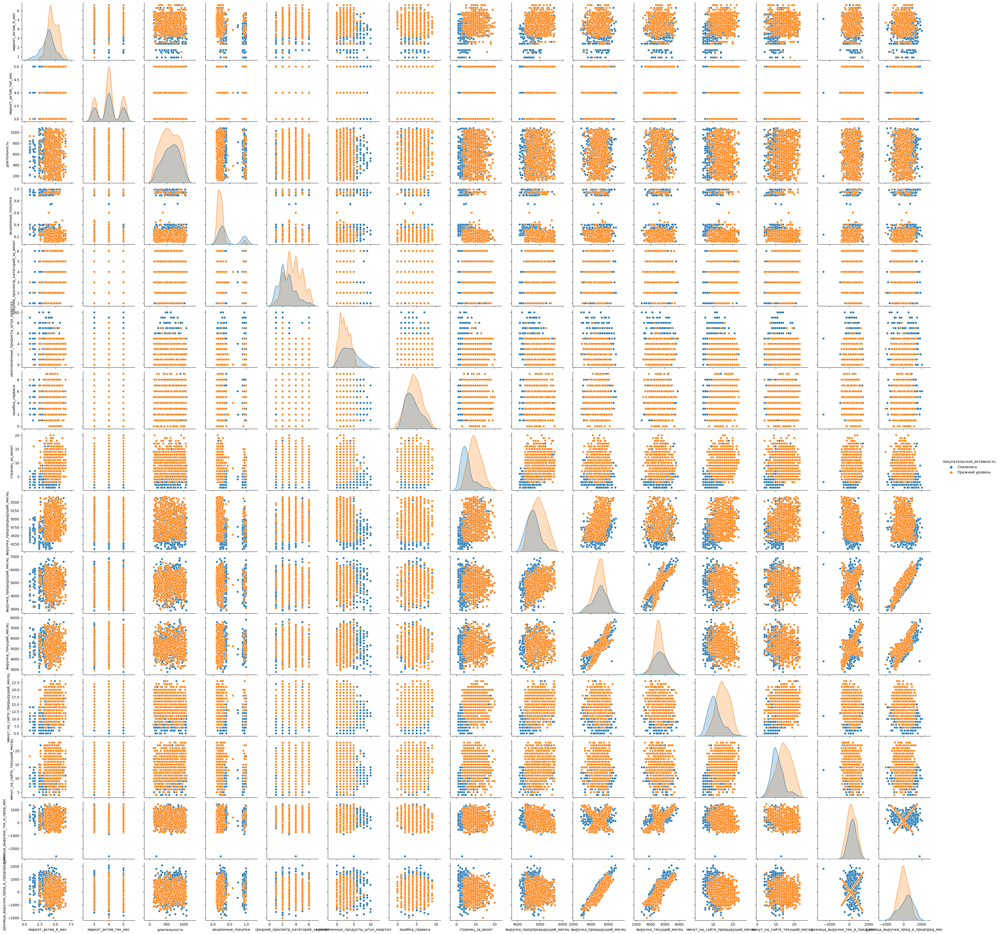

In [60]:
# строим диаграммы рассеяния
sns.pairplot(market, hue='покупательская_активность', diag_kind='kde');

### Выводы

- Анализ коэффициентов корреляции между количественными признаками показывает наличие сильной связи между парами признаков `выручка_текущий_месяц` и `выручка_предыдущий_месяц`, `выручка_текущий_месяц` и `разница_выручки_пред_и_предпред_мес`, `выручка_предыдущий_месяц` и `разница_выручки_пред_и_предпред_мес`. Поэтому не желательно использовать для обучения модели одновременно все признаки, характеризующие выручку по месяцам,  из-за потенциальных проблем с мультиколлинеарностью. Лучше использовать признак `выручка_текущий_месяц` вместе с признаками `разница_выручки_тек_и_пред_мес` и `разница_выручки_пред_и_предпред_мес`. Признаки, показывающие разницу в выручке, будут более информативны при анализе их влияния на целевой признак.

- Анализ коэффициентов корреляции Фи показывает:
    - С целевым признаком `покупательская_активность` сильнее всего связаны признаки `страниц_за_визит` (коэф. корр. 0.75) и `минут_на_сайте_предыдущий_месяц` (коэф. корр. 0.69). 
    - Признаки `минут_на_сайте_текущий_месяц`, `маркет_актив_6_мес`, `средний_просмотр_категорий_за_визит`, `акционные_покупки`, `неоплаченные_продукты_штук_квартал` и `выручка_предпредыдущий_месяц` имеют заметную связь с целевым признаком (коэф. корр. ≥ 0.5).
    - Признаки `разрешить_сообщать` и `маркет_актив_тек_мес` не коррелируют с целевым признаком (коэф. корр. = 0).

- Анализ диаграмм рассеяния выявил необычную связь между признаками, характеризующими выручку по месяцам. Сильнее всего это проявляется на графике совместного распределения признаков `разница_выручки_тек_и_пред_мес` и `разница_выручки_пред_и_предпред_мес`: у абсолютного большинства покупателей, активность которых осталась на прежнем уровне, наблюдается идеальная линейная зависимость между этими признаками, причём коэффициент линейной зависимости имеет может быть положительным или отрицательным, и при этом одинаковым по абсолютной величине. Возможное объяснение этого — постоянные клиенты магазина стабильно покупают одни и те же товары каждый месяц, а цены на них меняются в большую или меньшую сторону.

## Разработка модели для прогнозирования

### Подготовка данных для обучения моделей

Выделим из данных целевой признак в отдельную переменную и разделим данные на тренировочную и тестовую выборки.

- Бинаризуем целевой признак `покупательская_активность`, чтобы старший класс ("1") соответствовал значению `'Снизилась'`.

- Поскольку в данных существует дисбаланс классов, то при делении на выборки применим стратификацию по целевому признаку.

In [61]:
# создаём словарь со значениями целевого признака
target_dict = {'Прежний уровень': 0, 'Снизилась': 1}

In [62]:
# выделяем входные признаки и целевой признак в отдельные переменные
X = market.drop(columns=['покупательская_активность'])
y = market['покупательская_активность'].map(target_dict)

# делим данные на выборки
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.25,
    random_state=RANDOM_STATE, 
    stratify=y
)

Перед обучением моделей нужно подготовить данные: кодировать категориальные признаки и масштабировать количественные.

- Несмотря на то, что корреляционный анализ показал отсутствие связи целевого признака с признаками `разрешить_сообщать` и `маркет_актив_тек_мес`, оставим их в данных, чтобы убедиться в их низкой значимости.

- Из признаков, характеризующих выручку по месяцам, используем признаки `выручка_текущий_месяц`, `разница_выручки_тек_и_пред_мес` и `разница_выручки_пред_и_предпред_мес`, как показано на диаграмме Исикавы. При этом, чтобы избежать проблем с мультиколлинеарностью, признаки `выручка_предыдущий_месяц` и `выручка_предпредыдущий_месяц` использовать не будем. Признаки, показывающие разницу в выручке, будут более информативны при дальнейшем анализе их важности.

- Бинарные признаки `тип_сервиса` (значения "стандарт"/"премиум") и `разрешить_сообщать` (значения "нет"/"да") можно считать порядковыми. Для кодирования этих признаков используем `OrdinalEncoder`. Признак `популярная_категория` является номинальным: категории товаров нельзя проранжировать. Для кодирования этого признака используем `OneHotEncoder`.

- Для масштабирования количественных признаков применим стандартизацию (`StandardScaler`) к признакам, распределение которых не отличается слишком сильно от нормального, и нормализацию (`MinMaxScaler`) к признакам, распределение которых существенно отличается от нормального (`акционные_покупки` - бимодальное распределение, `длительность` - ближе к равномерному распределению). При этом далее на этапе настройки моделей можно подобрать оптимальный тип скейлера как гиперпараметр модели.

In [63]:
# категориальные номинальные признаки для кодирования OneHotEncoder
ohe_columns = [
    'популярная_категория',
]
# категориальные порядковые признаки для кодирования OrdinalEncoder
ord_columns = [
    'тип_сервиса',
    'разрешить_сообщать',
]
cat_columns = ohe_columns + ord_columns

# количественные признаки для масштабирования MinMaxScaler
minmax_columns = [
    'длительность',
    'акционные_покупки',
]
# количественные признаки для масштабирования StandardScaler
standard_columns = [
    'маркет_актив_6_мес',
    'маркет_актив_тек_мес',
    'средний_просмотр_категорий_за_визит',
    'неоплаченные_продукты_штук_квартал',
    'ошибка_сервиса',
    'страниц_за_визит',
    'минут_на_сайте_текущий_месяц',
    'минут_на_сайте_предыдущий_месяц',
    'выручка_текущий_месяц',
    'разница_выручки_тек_и_пред_мес',
    'разница_выручки_пред_и_предпред_мес',
]
num_columns = minmax_columns + standard_columns

print('Категориальные признаки для кодирования OneHotEncoder:', ohe_columns)
print('Категориальные признаки для кодирования OrdinalEncoder:', ord_columns)
print('Количественные признаки для масштабирования MinMaxScaler:', minmax_columns)
print('Количественные признаки для масштабирования StandardScaler:', standard_columns)
print()
print('Всего {} признаков, из них {} количественных и {} категориальных.'
      .format(len(num_columns + cat_columns),
              len(num_columns),
              len(cat_columns)
             ),
     )

Категориальные признаки для кодирования OneHotEncoder: ['популярная_категория']
Категориальные признаки для кодирования OrdinalEncoder: ['тип_сервиса', 'разрешить_сообщать']
Количественные признаки для масштабирования MinMaxScaler: ['длительность', 'акционные_покупки']
Количественные признаки для масштабирования StandardScaler: ['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'минут_на_сайте_текущий_месяц', 'минут_на_сайте_предыдущий_месяц', 'выручка_текущий_месяц', 'разница_выручки_тек_и_пред_мес', 'разница_выручки_пред_и_предпред_мес']

Всего 16 признаков, из них 13 количественных и 3 категориальных.


Определим пайплайны для подготовки данных и соберём из них итоговый пайплайн для обучения модели.
- В пайплайнах для кодирования категориальных признаков используем `SimpleImputer` для заполнения пропусков самым часто встречающимся значением.
- В пайплайнах для масштабирования количественных признаков используем `SimpleImputer` для заполнения пропусков медианным значением.
- Добавим в итоговый пайплайн селектор признаков `SelectKBest` для удаления признаков с низкой значимостью. В исходных данных 16 входных признаков, а после кодирования признака `популярная_категория` с помощью `OneHotEncoder` их станет 20. 
- В качестве базовой модели возьмём логистическую регрессию `LogisticRegression`, для учёта дисбаланса используя взвешивание классов с помощью аргумента `class_weight='balanced'`.

In [64]:
# пайплайн для кодирования категориальных номинальных признаков
ohe_pipe = Pipeline(
    [
        ('imputer', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)),
    ]
)
# пайплайн для кодирования категориальных номинальных признаков
ord_pipe = Pipeline(
    [
        ('imputer_before', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('encoder', OrdinalEncoder(
            handle_unknown='use_encoded_value', unknown_value=np.nan,
            categories=[
                ['стандарт', 'премиум'],
                ['нет', 'да']
            ])
        ),
        ('imputer_after', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ]
)
# пайплайн для нормализации количественных признаков
minmax_pipe = Pipeline(
    [
        ('imputer', SimpleImputer(missing_values=np.nan, strategy='median')),
        ('scaler', MinMaxScaler()),
    ]
)
# пайплайн для стандартизации количественных признаков
standard_pipe = Pipeline(
    [
        ('imputer', SimpleImputer(missing_values=np.nan, strategy='median')),
        ('scaler', StandardScaler()),
    ]
)
# общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('ordinal', ord_pipe, ord_columns),
        ('minmax', minmax_pipe, minmax_columns),
        ('standard', standard_pipe, standard_columns),
    ], 
    remainder='drop',
    verbose_feature_names_out=False,
)
# итоговый пайплайн
final_pipe = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('feature_selector', SelectKBest(score_func=f_classif, k='all')),
        ('model', LogisticRegression(
            solver='liblinear', 
            class_weight='balanced', 
            random_state=RANDOM_STATE)
        )
    ]
)

### Обучение и оценка качества моделей

#### Выбор метрики

В проекте требуется разработать модель классификации, которая должна предсказывать не только целевой класс (уровень покупательской активности: "Прежний уровень"/"Снизилась"), а **вероятность** снижения покупательской активности, то есть вероятность принадлежности к старшему классу. В такой ситуации наиболее подходящей метрикой для оценки качества моделей будет **ROC-AUC**, потому что эта метрика позволяет оценить качество модели вне зависимости от выбранного порога классификации. ROC-AUC не чувствительна к дисбалансу классов, поэтому подходит для несбалансированных данных.

#### Базовая модель

Рассчитаем ROC-AUC базовой модели (логистической регрессии) на тренировочной выборке при кросс-валидации.

In [65]:
# вычисляем метрику базовой модели на тренировояной выборке при кросс-валидации
baseline_cv_score = cross_val_score(final_pipe, X_train, y_train, cv=5, n_jobs=-1, scoring='roc_auc')
baseline_mean_cv_score = baseline_cv_score.mean()
baseline_std_cv_score = baseline_cv_score.std()
print('ROC-AUC базовой модели на тренировочной выборке при кросс-валидации:')
print(f'Среднее значение: {baseline_mean_cv_score:.4f}')
print(f'Стандартное отклонение: {baseline_std_cv_score:.4f}')

ROC-AUC базовой модели на тренировочной выборке при кросс-валидации:
Среднее значение: 0.8978
Стандартное отклонение: 0.0201


Подберём оптимальные параметры подготовки данных для обучения модели: тип скейлера и количество значимых признаков. Для этого используем поиск по сетке с помощью `GridSearchCV`, который определит параметры, при которых метрика на кросс-валидации максимальна.

In [66]:
# словарь со списками параметров для перебора
parameters = {
    'preprocessor__minmax__scaler': [StandardScaler(), MinMaxScaler()],
    'preprocessor__standard__scaler': [StandardScaler(), MinMaxScaler()],
    'feature_selector__k': range(2, 21)
}
# инициализируем класс для автоматизированного подбора параметров
model_grid_baseline = GridSearchCV(
    final_pipe,
    parameters,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1 
)
# запускаем таймер
start = time()
# запускаем подбор параметров 
model_grid_baseline.fit(X_train, y_train)
# считаем, сколько секунд прошло с начала запуска
search_time = time() - start
print(f'Время поиска {search_time:.3f} с')

Время поиска 25.386 с


In [67]:
# лучшая метрика на кросс-валидации
baseline_mean_cv_score = model_grid_baseline.best_score_
print(f'Лучшая ROC-AUC: {baseline_mean_cv_score:.4f}')

Лучшая ROC-AUC: 0.9020


In [68]:
# оптимальные параметры подготовки данных
model_grid_baseline.best_params_

{'feature_selector__k': 9,
 'preprocessor__minmax__scaler': MinMaxScaler(),
 'preprocessor__standard__scaler': MinMaxScaler()}

Получается, что лучшее качество базовой модели обеспечивает применение `MinMaxScaler` для масштабирования всех количественных признаков и отбор только 9 наиболее значимых входных признаков. 

Посмотрим на коэффициенты влияния признаков, чтобы понять, какие признаки наиболее важны для базовой модели.

,Признак,Коэффициент
0,неоплаченные_продукты_штук_квартал,2.517984
1,страниц_за_визит,-2.412271
2,акционные_покупки,2.199446
3,минут_на_сайте_предыдущий_месяц,-2.173434
4,средний_просмотр_категорий_за_визит,-2.042402
5,маркет_актив_6_мес,-1.685512
6,минут_на_сайте_текущий_месяц,-1.658183
7,разница_выручки_пред_и_предпред_мес,1.146997
8,популярная_категория_Мелкая бытовая техника и электроника,-0.816298


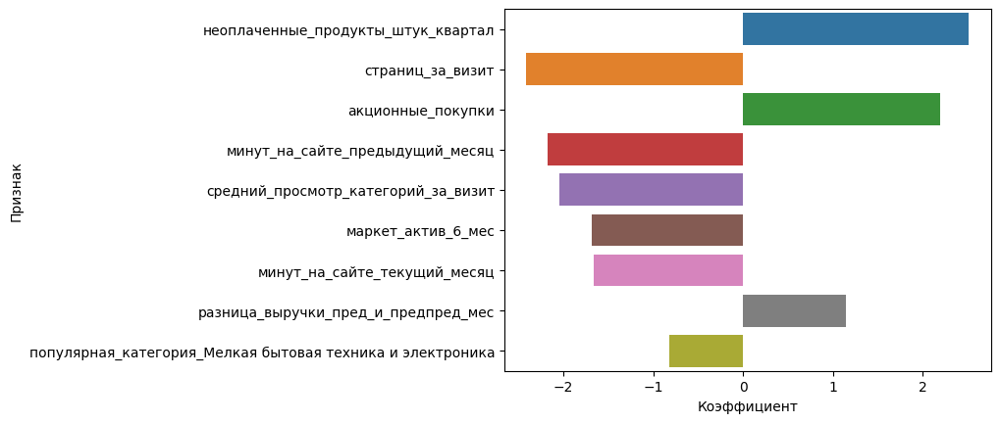

In [69]:
# названия признаков
feature_names = model_grid_baseline.best_estimator_[:-1].get_feature_names_out()
# коэффициенты влияния признаков
coef = model_grid_baseline.best_estimator_['model'].coef_[0]
# формируем таблицу
feature_coef = (
    pd.DataFrame({'Признак': feature_names, 'Коэффициент': coef})
    .sort_values(by='Коэффициент', key=lambda x: abs(x), ascending=False)
    .reset_index(drop=True)
)
# выводим таблицу
display(feature_coef)
# визуализируем данные в таблице
sns.barplot(data=feature_coef, x='Коэффициент', y='Признак');

Результаты в целом вполне логичны: большое количество неоплаченных товаров в корзине, высокая доля акционных покупок указывают на снижение активности покупателя. И наоборот, если покупатель активно просматривал сайт, получал много маркетинговых коммуникаций, то его активность скорее всего не снизится. Кроме того, покупатели техники, у которой более длительный жизненный цикл, также менее склонны к снижению активности. 

Нетривиально то, что со снижением активности покупателей оказался связан рост выручки в предыдущем месяце относительно предпредыдущего. Это можно объяснить тем, что покупатели, которые закупились всем необходимым впрок, совершают меньше покупок.

#### Обучение моделей и подбор гиперпараметров

Попробуем найти модель получше, которая покажет более высокую метрику. Для этого обучим модели четырёх классов: `LogisticRegression`, `KNeighborsClassifier`, `DecisionTreeClassifier` и `SVC`. Для модели каждого класса подберём оптимальные значения гиперпараметров методом перебора по сетке с помощью инструмента `GridSearchCV`.
- Для модели логистической регрессии `LogisticRegression` используем ранее найденные оптимальные параметры подготовки данных и подберём тип регуляризации (L1 или L2) и её силу.
- Для модели k ближайших соседей `KNeighborsClassifier` подберём тип скейлера и число ближайших соседей, а также количество значимых признаков для обучения модели. 
- Для модели дерева решений `DecisionTreeClassifier` подберём два гиперпараметра: минимальное количество объектов в узле для разделения и  минимальное количество объектов в листе, а также количество значимых признаков для обучения модели. К типу скейлера модель дерева решений должна быть не очень чувствительна, поэтому используем значения по умолчанию из пайплайна.
- Для модели опорных векторов `SVC` подберём тип ядра (RBF или полиномиальный) и силу регуляризации, а также тип скейлера и количество значимых признаков для обучения модели.
- С помощью селектора признаков `SelectKBest` имеет смысл удалить как минимум 2 признака с самой низкой важностью, чтобы снизить зашумлённость входных данных и вероятность переобучения модели.

**Примечание:** Время подбора оптимальных гиперпараметров и определения лучшей модели при поиске по сетке получается довольно большое, порядка 10-15 минут на старом 4-х ядерном процессоре ноутбука.

In [70]:
# список словарей со значениями гиперпараметров для каждого типа модели
param_grid = [
    {
        'model': [
            LogisticRegression(
                solver='liblinear', 
                class_weight='balanced', 
                random_state=RANDOM_STATE,
            )
        ],
        'model__penalty': ['l2', 'l1'],
        'model__C': np.logspace(-2, 1, num=13),
        'preprocessor__standard__scaler': [MinMaxScaler()],
        'feature_selector__k': [9]
    },
    {
        'model': [KNeighborsClassifier()],
        'model__n_neighbors': range(2, 30),
        'preprocessor__minmax__scaler': [MinMaxScaler(), StandardScaler()],
        'preprocessor__standard__scaler': [MinMaxScaler(), StandardScaler()],
        'feature_selector__k': range(9, 19)
    },
    {
        'model': [
            DecisionTreeClassifier(
                random_state=RANDOM_STATE, 
                class_weight='balanced',
            )
        ],
        'model__min_samples_split': range(2, 11),
        'model__min_samples_leaf': range(1, 11),
        'feature_selector__score_func': [mutual_info_classif],
        'feature_selector__k': range(6, 11)
    },
    {
        'model': [
            SVC(
                class_weight='balanced', 
                probability=True, 
                random_state=RANDOM_STATE,
            )
        ],
        'model__C': np.logspace(-1, 1, num=5),
        'preprocessor__minmax__scaler': [MinMaxScaler(), StandardScaler()],
        'preprocessor__standard__scaler': [MinMaxScaler(), StandardScaler()],
        'feature_selector__k': range(9, 19),
    },
    {
        'model': [
            SVC(
                kernel='poly', 
                class_weight='balanced', 
                probability=True, 
                random_state=RANDOM_STATE,
            )
        ],
        'model__degree': range(2, 4),
        'model__C': np.logspace(-1, 1, num=5),
        'preprocessor__minmax__scaler': [MinMaxScaler(), StandardScaler()],
        'preprocessor__standard__scaler': [MinMaxScaler(), StandardScaler()],
        'feature_selector__k': range(9, 19)
    },
]
# инициализируем класс для автоматизированного подбора параметров
model_grid = GridSearchCV(
    final_pipe,
    param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1 
)
# запускаем таймер
start = time()
# запускаем поиск гиперпараметров
model_grid.fit(X_train, y_train)
# считаем, сколько секунд прошло с начала запуска
search_time = time() - start
print(f'Время поиска {search_time:.3f} с')

Время поиска 1332.314 с


Посмотрим на топ-3 результатов.

In [71]:
# формируем таблицу
grid_results = pd.DataFrame(model_grid.cv_results_).sort_values(by='rank_test_score')
# выводим таблицу
grid_results.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_feature_selector__k,param_model,param_model__C,param_model__penalty,param_preprocessor__standard__scaler,param_model__n_neighbors,param_preprocessor__minmax__scaler,param_feature_selector__score_func,param_model__min_samples_leaf,param_model__min_samples_split,param_model__degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1787,0.688856,0.042594,0.070351,0.003994,18,"SVC(class_weight='balanced', probability=True, random_state=42)",1.0,NaN,StandardScaler(),NaN,StandardScaler(),NaN,NaN,NaN,NaN,"{'feature_selector__k': 18, 'model': SVC(class_weight='balanced', probability=True, random_state=42), 'model__C': 1.0, 'preprocessor__minmax__scaler': StandardScaler(), 'preprocessor__standard__scaler': StandardScaler()}",0.920594,0.931444,0.930518,0.922635,0.878041,0.916646,0.019765,1
1767,0.702106,0.023724,0.077955,0.008973,17,"SVC(class_weight='balanced', probability=True, random_state=42)",1.0,NaN,StandardScaler(),NaN,StandardScaler(),NaN,NaN,NaN,NaN,"{'feature_selector__k': 17, 'model': SVC(class_weight='balanced', probability=True, random_state=42), 'model__C': 1.0, 'preprocessor__minmax__scaler': StandardScaler(), 'preprocessor__standard__scaler': StandardScaler()}",0.919589,0.929333,0.924437,0.927815,0.878041,0.915843,0.019195,2
1791,0.723871,0.016847,0.075186,0.005010,18,"SVC(class_weight='balanced', probability=True, random_state=42)",3.162278,NaN,StandardScaler(),NaN,StandardScaler(),NaN,NaN,NaN,NaN,"{'feature_selector__k': 18, 'model': SVC(class_weight='balanced', probability=True, random_state=42), 'model__C': 3.1622776601683795, 'preprocessor__minmax__scaler': StandardScaler(), 'preprocessor__standard__scaler': StandardScaler()}",0.924056,0.931444,0.927928,0.912838,0.881869,0.915627,0.018000,3


Похоже, лидирует модель SVC.

### Выбор лучшей модели

Сформируем итоговую таблицу с наилучшими результатами для каждого класса моделей.

In [72]:
# список классов моделей
models_list = ['LogisticRegression', 'KNeighborsClassifier', 'DecisionTreeClassifier', 'SVC']

# формируем список лучших моделей каждого класса
grid_summary = []
for model_type in models_list:
    grid_summary.append(
        grid_results[grid_results['param_model'].astype('str').str.startswith(model_type)]
        .head(1).loc[:, ['params', 'mean_test_score', 'std_test_score']])
# формируем итоговую таблицу
grid_summary = pd.concat(grid_summary)
grid_summary['model'] = models_list
grid_summary = (
    grid_summary
    .set_index('model')
    .sort_values(by='mean_test_score', ascending=False)
)
# выводим таблицу
grid_summary

,params,mean_test_score,std_test_score
model,,,
SVC,"{'feature_selector__k': 18, 'model': SVC(class_weight='balanced', probability=True, random_state=42), 'model__C': 1.0, 'preprocessor__minmax__scaler': StandardScaler(), 'preprocessor__standard__scaler': StandardScaler()}",0.916646,0.019765
KNeighborsClassifier,"{'feature_selector__k': 15, 'model': KNeighborsClassifier(), 'model__n_neighbors': 15, 'preprocessor__minmax__scaler': StandardScaler(), 'preprocessor__standard__scaler': StandardScaler()}",0.913712,0.019297
LogisticRegression,"{'feature_selector__k': 9, 'model': LogisticRegression(class_weight='balanced', random_state=42, solver='liblinear'), 'model__C': 0.03162277660168379, 'model__penalty': 'l2', 'preprocessor__standard__scaler': MinMaxScaler()}",0.903258,0.024248
DecisionTreeClassifier,"{'feature_selector__k': 6, 'feature_selector__score_func': <function mutual_info_classif at 0x7fd55a3a2670>, 'model': DecisionTreeClassifier(class_weight='balanced', random_state=42), 'model__min_samples_leaf': 5, 'model__min_samples_split': 7}",0.878187,0.003529


Выведем параметры лучшей модели, показавшей максимальное значение метрики ROC-AUC.

In [73]:
print('Параметры лучшей модели:\n', model_grid.best_params_)
print(f'\nМетрика ROC-AUC лучшей модели: { model_grid.best_score_:.4f}')

Параметры лучшей модели:
 {'feature_selector__k': 18, 'model': SVC(class_weight='balanced', probability=True, random_state=42), 'model__C': 1.0, 'preprocessor__minmax__scaler': StandardScaler(), 'preprocessor__standard__scaler': StandardScaler()}

Метрика ROC-AUC лучшей модели: 0.9166


Лучшая модель с максимальной метрикой ROC-AUC на кросс-валидации — это модель опорных векторов SVC с параметром силы регуляризации C = 1 (значение по умолчанию) и взвешиванием классов, обученная на данных с 18 признаками, из которых все количественные масштабированы стандартизацией.

Посмотрим, какие входные признаки использует лучшая модель.

In [74]:
# названия входных признаков после подготовки данных
all_features = model_grid.best_estimator_['preprocessor'].get_feature_names_out()
# получаем индексы отобранных признаков
mask = model_grid.best_estimator_['feature_selector'].get_support()
# получаем названия отобранных признаков
new_features = all_features[mask]
# выводим список отобранных признаков
new_features.tolist()

['популярная_категория_Косметика и аксессуары',
 'популярная_категория_Кухонная посуда',
 'популярная_категория_Мелкая бытовая техника и электроника',
 'популярная_категория_Техника для красоты и здоровья',
 'популярная_категория_Товары для детей',
 'тип_сервиса',
 'длительность',
 'акционные_покупки',
 'маркет_актив_6_мес',
 'средний_просмотр_категорий_за_визит',
 'неоплаченные_продукты_штук_квартал',
 'ошибка_сервиса',
 'страниц_за_визит',
 'минут_на_сайте_текущий_месяц',
 'минут_на_сайте_предыдущий_месяц',
 'выручка_текущий_месяц',
 'разница_выручки_тек_и_пред_мес',
 'разница_выручки_пред_и_предпред_мес']

Интересно, какие признаки были отброшены как малозначимые при отборе признаков.

In [75]:
# разность множеств признаков
set(all_features) - set(new_features)

{'маркет_актив_тек_мес', 'разрешить_сообщать'}

Как и ожидалось, признаки `разрешить_сообщать` и `маркет_актив_тек_мес` оказались самыми малозначимыми.

Оценим значение метрики ROC-AUC лучшей модели на тестовой выборке.

In [76]:
# получаем предсказания вероятности принадлежности к старшему классу
y_test_prоba = model_grid.best_estimator_.predict_proba(X_test)[:, 1]
# считаем метрику на тестовой выборке
print(f'Метрика ROC-AUC лучшей модели на тестовой выборке: {roc_auc_score(y_test, y_test_prоba):.4f}')

Метрика ROC-AUC лучшей модели на тестовой выборке: 0.9197


Значение метрики на тестовой выборке получилось даже выше, чем на тренировочной при кросс-валидации. Это хорошо — значит, модель не переобучилась.

Посмотрим также на матрицу ошибок модели на тестовой выборке.

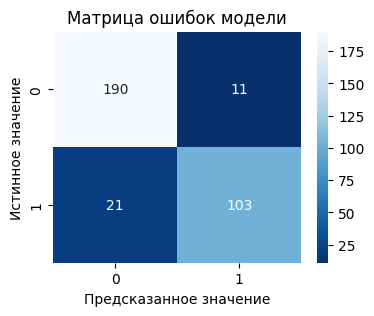

In [77]:
# получаем предсказания меток классов
y_test_pred = model_grid.best_estimator_.predict(X_test)
# строим матрицу ошибок модели
plot_confusion_matrix(y_test, y_test_pred)

Модель допускает больше ошибок типа False Negative, т.е. для неё Precision > Recall. Получается, несмотря на использование взвешивания классов, всё равно модель лучше предсказывает мажорный класс. Но соотношение Precision/Recall можно в дальнейшем при необходимости настроить подбором порога классификации.

### Выводы

- Подготовка данных для обучения моделей организована внутри пайплайна: заполнение пропусков, кодирование категориальных признаков, масштабирование количественных, отбор значимых признаков.
    - Из признаков, характеризующих выручку по месяцам, использованы только признаки `выручка_текущий_месяц`, `разница_выручки_тек_и_пред_мес` и `разница_выручки_пред_и_предпред_мес`, чтобы избежать проблем с мультиколлинеарностью. Признаки, показывающие разницу в выручке, будут более информативны при дальнейшем анализе их важности.
    - Для кодирования категориальных признаков использованы `OrdinalEncoder` (бинарные порядковые признаки `тип_сервиса` и `разрешить_сообщать`) и `OneHotEncoder` (номинальный признак `популярная_категория`).
    - Для масштабирования количественных признаков применена нормализация (`MinMaxScaler`) к признакам, распределение которых существенно отличается от нормального (`акционные_покупки` - бимодальное распределение, `длительность` - ближе к равномерному распределению) и стандартизация (`StandardScaler`) к остальным признакам, распределение которых не отличается слишком сильно от нормального. При этом далее на этапе настройки моделей тип скейлера подбирался как гиперпараметр модели.
    - Для удаления признаков с низкой значимостью использован селектор признаков `SelectKBest`.

- Для сравнения качества моделей при подборе гиперпараметров и выборе лучшей модели использована метрика **ROC-AUC**, потому что эта метрика лучше всего подходит в рассматриваемой задаче предсказания вероятности снижения покупательской активности, т.к. позволяет оценить качество модели вне зависимости от выбранного порога классификации и не чувствительна к дисбалансу классов.

- Поиск лучшей модели выполнен путём подбора оптимальных значений гиперпараметров для моделей четырёх классов (`LogisticRegression`, `KNeighborsClassifier`, `DecisionTreeClassifier` и `SVC`) методом перебора по сетке с помощью инструмента `GridSearchCV`. При этом класс модели, тип скейлера и количество входных признаков тоже подбирались как гиперпараметры лучшей модели. Для лучшего учёта дисбаланса классов в моделях `LogisticRegression` и `SVC` использовано взвешивание классов.

- Лучшая модель с максимальной метрикой ROC-AUC на кросс-валидации — это модель опорных векторов SVC с параметром силы регуляризации C = 1 (значение по умолчанию) и взвешиванием классов, обученная на данных с 18 признаками (16 исходных признаков, за исключением `разрешить_сообщать` и `маркет_актив_тек_мес`, а признак `популярная_категория` преобразуется в 5 бинарных признаков при кодировании), из которых все количественные масштабированы стандартизацией.

- Метрика ROC-AUC лучшей модели на тренировочной выборке при кросс-валидации: 0.9166, на тестовой выборке даже немного выше: 0.9197. Это хорошо — значит, модель не переобучилась.

- Матрица ошибок лучшей модели на тестовой выборке показывает, что модель допускает больше ошибок типа False Negative, т.е. для неё Precision > Recall. Но соотношение Precision/Recall можно в дальнейшем при необходимости настроить подбором порога классификации.

## Анализ важности признаков

### Подготовка данных

Подготовим данные для оценки важности признаков:
- Возьмём из пайплайна лучшей модели трансформер для подготовки данных и преобразуем с его помощью тренировочную и тестовую выборки, добавив в них названия входных признаков.
- Повторно обучим лучшую модель на тренировочной выборке.

In [78]:
# пайплайн лучшей модели
best_pipe = model_grid.best_estimator_
# лучшая модель
best_model = best_pipe['model']
# трансформер для подготовки данных из пайплайна лучшей модели
best_transformer = best_pipe[:-1]

# преобразуем тренировочную выборку
X_train_transformed = best_transformer.fit_transform(X_train, y_train)
# получаем из трансформера названия признаков
feature_names_out = best_transformer.get_feature_names_out()
# добавляем в тренировочную выборку названия признаков
X_train_transformed = pd.DataFrame(X_train_transformed, columns=feature_names_out)

# преобразуем тестовую выборку
X_test_transformed = best_transformer.transform(X_test)
# добавляем в тестовую выборку названия признаков
X_test_transformed = pd.DataFrame(X_test_transformed, columns=feature_names_out)

# повторно обучаем модель на тренировочной выборке
best_model.fit(X_train_transformed, y_train);

### Permutation importance

Оценим важность признаков для лучшей модели методом "permutation importance".

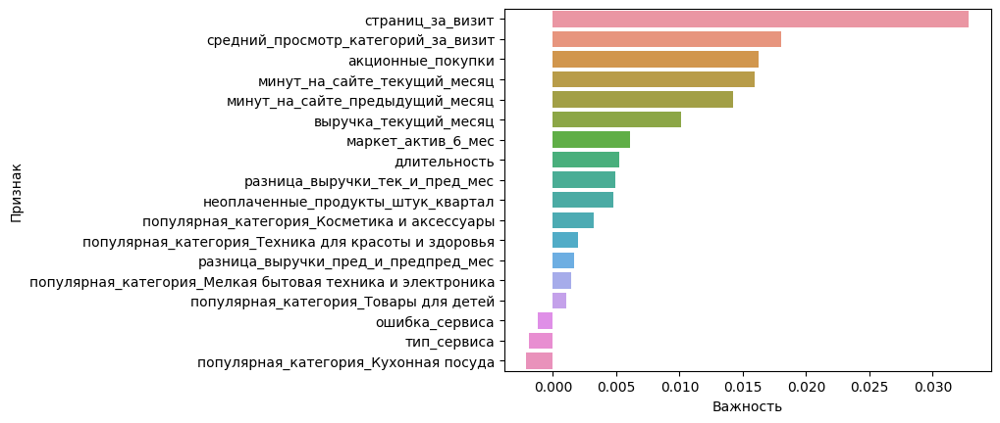

In [79]:
# определяем важность признаков для модели
permutation = permutation_importance(best_model, X_test_transformed, y_test, scoring='roc_auc', random_state=RANDOM_STATE)
# строим график важности признаков
feature_importance = pd.DataFrame(
    {'Признак': best_model.feature_names_in_, 'Важность': permutation['importances_mean']}
).sort_values(by='Важность', ascending=False)
# строим график важности признаков для модели
sns.barplot(data=feature_importance, x='Важность', y='Признак');

Самый важный для модели признак — `страниц_за_визит`, далее в порядке убывания важности следуют ещё 5 важных признаков: `средний_просмотр_категорий_за_визит`, `акционные_покупки`, `минут_на_сайте_текущий_месяц`, `минут_на_сайте_предыдущий_месяц` и `выручка_текущий_месяц`.

Признаки с околонулевым или отрицательным значением permutation importance имеют низкую важность для модели. Среди них `тип_сервиса` и `ошибка_сервиса`. Признаки `маркет_актив_тек_мес` и `разрешить_сообщать` были исключены из числа значимых ещё на этапе подготовки данных для обучения модели, что соответствует результатам корреляционного анализа.

### SHAP

Оценим важность признаков для лучшей модели с помощью метода SHAP. 

In [80]:
# инициализируем объект shap.Explainer
shap_explainer = shap.Explainer(best_model.predict_proba, X_train_transformed, seed=RANDOM_STATE)
# вычисляем значения Шепли для тестовой выборки
shap_values = shap_explainer(X_test_transformed)
# выделяем объяснения для вероятности принадлежности к старшему классу
shap_values = shap_values[..., 1]

PermutationExplainer explainer: 326it [26:41,  4.93s/it]                         


Построим график общей значимости признаков, показывающий общий вклад признаков в прогнозы модели. На нём представлены средние SHAP-значения признака по всем наблюдениям.

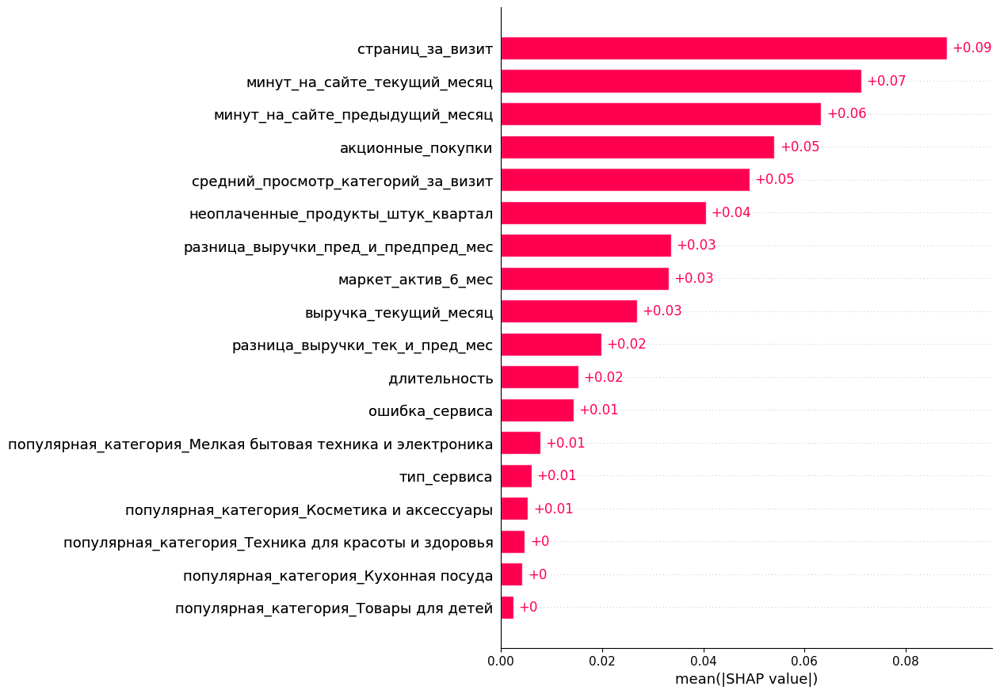

In [81]:
# строим график общей значимости признаков
shap.plots.bar(shap_values, max_display=20) 

Топ-5 наиболее значимых для модели признаков по версии метода SHAP совпадает с соответствующим топ-5 по методу "permutation importance". Результаты определения наименее важных признаков двумя методами тоже согласуются.

Для оценки влияния значений признаков на предсказанную вероятность принадлежности объекта к одному из двух классов построим диаграмму, которая показывает вклад всех признаков в классификацию каждого наблюдения.

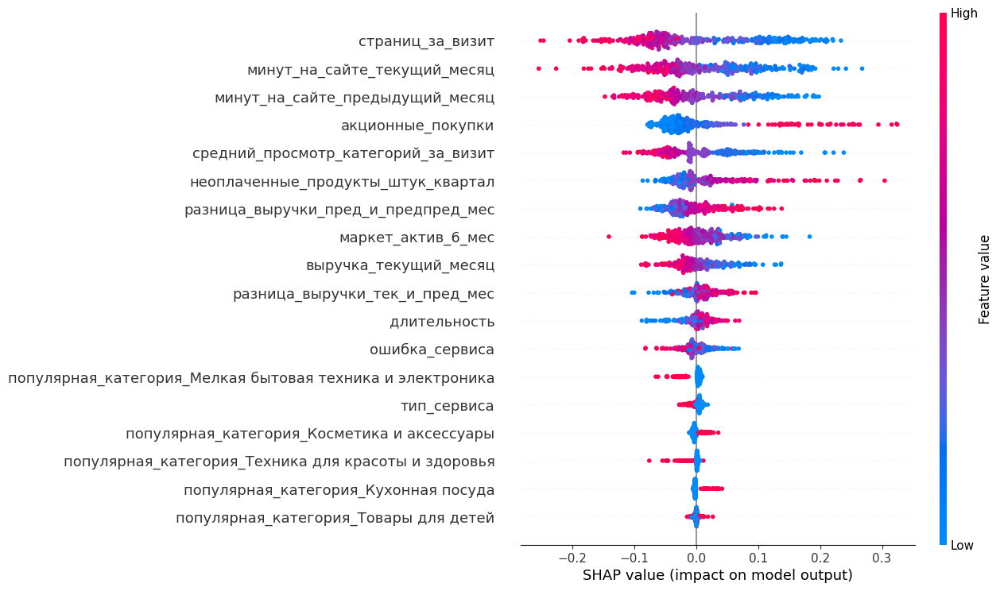

In [82]:
# строим график, который показывает вклад всех признаков в классификацию каждого объекта
shap.plots.beeswarm(shap_values, max_display=20)

### Выводы

Анализ важности признаков для лучшей модели, предсказывающей вероятность снижения покупательской активности, показал:
- Мало значимы признаки, характеризующие коммуникацию с клиентом, особенно низкую значимость имеют признаки `маркет_актив_тек_мес`, `разрешить_сообщать` (они были отсеяны ещё на этапе выбора лучшей модели) и `тип_сервиса`. Это указывает на то, что текущая стратегия маркетинговых коммуникаций с покупателями не эффективна.
- Среднюю значимость имеют признаки, характеризующие финансовое поведение покупателя (выручку и её динамику). Причём положительная динамика выручки от покупателя за прошедший период приводит к снижению его активности в будущем. 
- Сильнее всего на вероятность снижения покупательской активности влияют признаки, характеризующие поведение покупателя на сайте (количество просмотренных страниц и время, проведённое на сайте), а также признаки, характеризующие продуктовое поведение покупателя (доля акционных покупок, количество просмотренных категорий товаров и количество неоплаченных товаров в корзине).
    - Чем менее активен покупатель на сайте и чем меньше категорий товаров смотрит, тем выше вероятность снижения его активности.
    - Чем больше доля акционных покупок и количество неоплаченных товаров в корзине у покупателя, тем выше вероятность снижения его активности.

Информация о степени влияния признаков на прогноз активности покупателей важна при моделировании и принятии бизнес-решений:
- При моделировании можно отбросить малозначимые признаки и учитывать только наиболее важные. Это может повысить качество предсказаний модели.
- По значимости соответствующих признаков можно оценить эффективность маркетинговых коммуникаций с покупателями. В данном случае она оказалась низкой.
- Учёт значимости различных групп признаков позволит эффективно более распределить бюджет на удержание активности покупателей. Стоит направить средства на то, чтобы стимулировать покупателей чаще заходить на сайт и проводить на нём больше времени, например, предлагая больше рекомендаций и увеличив частоту маркетинговых коммуникаций. Также имеет смысл стимулировать активность покупателей, которые много покупали в прошедшие периоды, например, в рамках программы лояльности, начисляя бонусы за покупки.
- По значимости признаков, характеризующих поведение покупателей, можно определить, на какие признаки нужно обратить внимание при выделении сегментов покупателей с высокой вероятностью снижения активности, для которых планируется разработать специальные предложения.

## Сегментация покупателей

### Объединение таблиц

Добавим в таблицу `market` информацию о среднемесячной прибыли магазина от покупателя за последние 3 месяца из таблицы `money`.

In [83]:
# формируем объединённую таблицу,
# соединяем таблицу 'market' с таблицей 'money' по индексу - id покупателя
market = market.join(money.set_index('id'))
# выводим первые 5 строк итоговой таблицы
market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предпредыдущий_месяц,выручка_предыдущий_месяц,выручка_текущий_месяц,минут_на_сайте_предыдущий_месяц,минут_на_сайте_текущий_месяц,разница_выручки_тек_и_пред_мес,разница_выручки_пред_и_предпред_мес,прибыль
id,,,,,,,,,,,,,,,,,,,,
215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4472.0,5216.0,4971.6,12,10,-244.4,744.0,4.16
215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,4826.0,5457.5,5058.4,8,13,-399.1,631.5,3.13
215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,4793.0,6158.0,6610.4,11,13,452.4,1365.0,4.87
215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,4594.0,5807.5,5872.5,8,11,65.0,1213.5,4.21
215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,5124.0,4738.5,5388.5,10,10,650.0,-385.5,3.95


### Сегментация покупателей

Для сегментации покупателей спрогнозиуем вероятность снижения их активности с помощью разработанной модели.

Обучим лучшую модель на всех данных и получим прогноз вероятности снижения покупательской активности. Заодно оценим значение метрики ROC-AUC.

In [84]:
# повторно обучаем лучшую модель в пайплайне на всех данных
best_pipe.fit(X, y)
# получаем вероятности принадлежности к старшему классу, т.е. снижения активности
y_proba = best_pipe.predict_proba(X)[:, 1]
# считаем метрику 
print(f'Метрика ROC-AUC лучшей модели на всех данных: {roc_auc_score(y, y_proba):.4f}')

Метрика ROC-AUC лучшей модели на всех данных: 0.9629


Значение метрики более чем достойное. Это означает, что модель хорошо объясняет те данные, на которых была обучена.

Добавим в таблицу `market` новый столбец со значениями вероятности снижения покупательской активности.

In [85]:
# добавляем в таблицу новый столбец
market['вероятность_снижения_активности'] = y_proba

Исследуем распределение вероятности снижения покупательской активности.

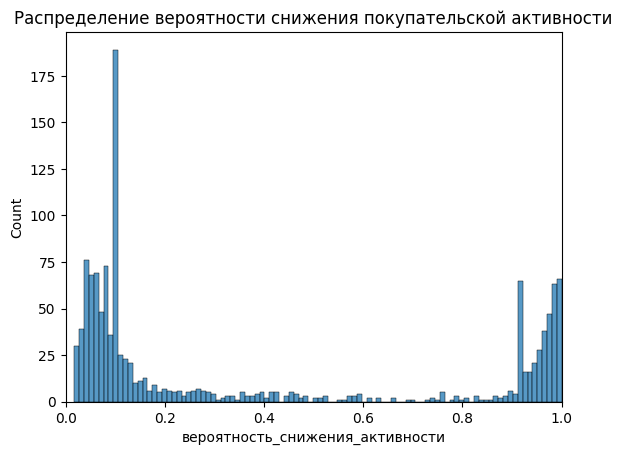

In [86]:
# строим гистограмму распределения
sns.histplot(market['вероятность_снижения_активности'], bins=100)
plt.xlim(0, 1)
plt.title('Распределение вероятности снижения покупательской активности');

На распределении заметны странные пики вблизи вероятностей 0.1 и 0.9.Возможно, это особенность работы модели SVC, т.к. в ней вероятности получаются масштабированием Платта.

Исследуем также распределение покупателей по прибыльности с разбивкой по уровню покупательской активности.

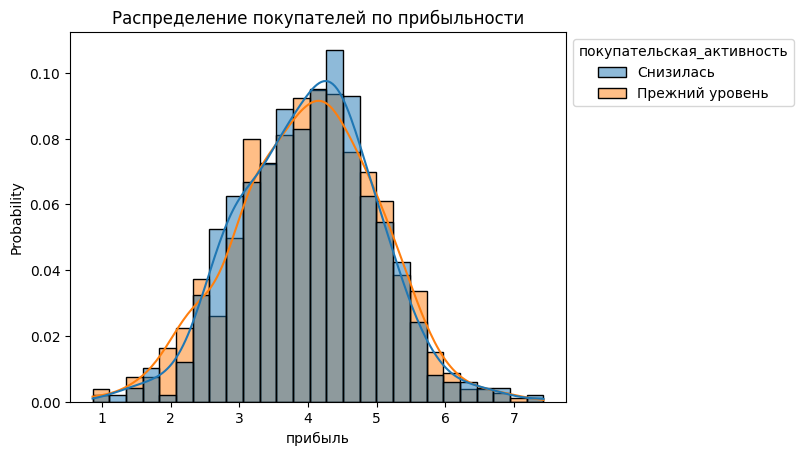

In [87]:
# строим гистограммы распределения
ax = sns.histplot(
    data=market, 
    x='прибыль',
    hue='покупательская_активность', 
    kde=True,
    stat='probability', 
    common_norm=False)
sns.move_legend(ax, 'upper left', bbox_to_anchor=(1, 1))
plt.title('Распределение покупателей по прибыльности');

Как можно видеть, распределение примерно одинаково для обоих классов.

Чтобы выявить сегменты покупателей по их прибыльности, исследуем совместное распределение прибыли и вероятности снижения покупательской активности, построив диаграмму рассеяния.

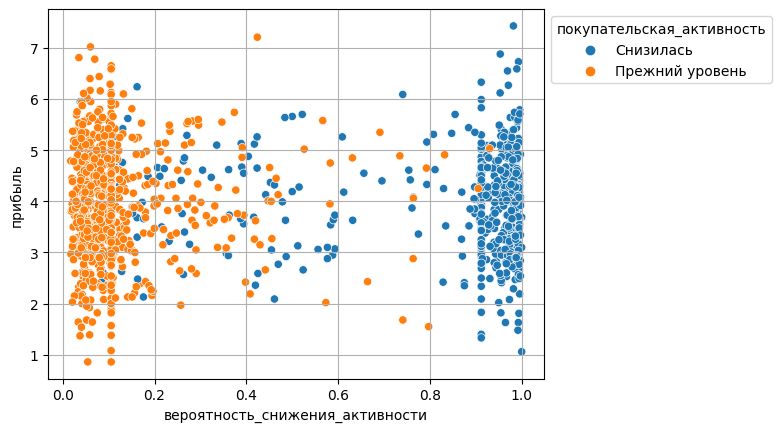

In [88]:
# строим диаграмму рассеяния
ax = sns.scatterplot(
    data=market,
    x='вероятность_снижения_активности',
    y='прибыль',
    hue='покупательская_активность',
)
plt.grid()
sns.move_legend(ax, 'upper left', bbox_to_anchor=(1, 1))

Как уже было видно по гистограмме, распределение покупателей по прибыльности близко к нормальному для обоих классов по признаку `покупательская_активность`. В такой ситуации разбивка на сегменты будет весьма условной, т.к. отдельных кластеров на диаграмме рассеяния нет, а значит нет и чётких границ между сегментами.

Попробуем выделить сегменты по другому признаку, характеризущему продуктовое поведение покупателей, который является значимым при прогнозировании вероятности снижения покупательской активности — `акционные_покупки`. Ранее на этапе исследовательского анализа данных было установлено, что распределение этого признака имеет бимодальный характер: есть две группы покупателей, с низкой и с высокой долей акционных покупок. Поэтому исследуем совместное распределение доли акционных покупок и вероятности снижения покупательской активности, построив диаграмму рассеяния.

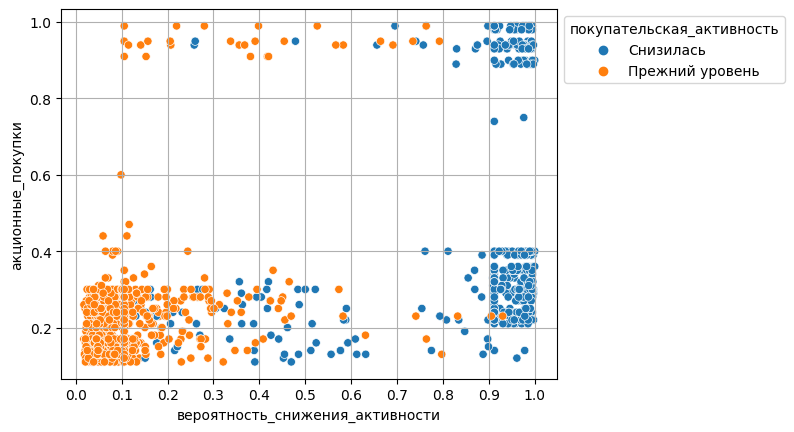

In [89]:
# строим диаграмму рассеяния
ax = sns.scatterplot(
    data=market,
    x='вероятность_снижения_активности',
    y='акционные_покупки',
    hue='покупательская_активность'
)
plt.xticks(np.arange(0, 1.1, 0.1))
plt.grid()
sns.move_legend(ax, 'upper left', bbox_to_anchor=(1, 1))

На диаграмме рассеяния можно видеть три выраженных обособленных сегмента (кластера): 
- покупатели с низкой вероятностью снижения активности и низкой долей акционных покупок,
- покупатели с высокой вероятностью снижения активности и низкой долей акционных покупок,
- покупатели с высокой вероятностью снижения активности и высокой долей акционных покупок.

### Анализ сегмента покупателей

#### Выделение сегмента

Выберем для подробного исследования сегмент покупателей с максимальной долей акционных покупок (> 0.85) и высокой вероятностью снижения покупательской активности (> 0.8). Несмотря на то, что доля выбранного сегмента невелика, для чётко выделяющегося компактного сегмента легче подобрать персонализированные предложения, которые помогут увеличить покупательскую активность и повысить прибыльность сегмента. Кроме того, покупатели, которые следят за акциями, как правило более восприимчивы к маркетинговым коммуникациям. Поэтому можно ожидать для выбранного сегмента хорошей конверсии персонализированных предложений в покупки.

Рассмотрим выбранный сегмент покупателей в сравнении со всеми покупателями, чья активность снизилась. Для этого промаркируем покупателей выбранного сегмента и выделим из таблицы `market` данные о покупателях, чья активность снизилась.

In [90]:
# маркируем выбранный сегмент покупателей в таблице 'market'
market['сегмент'] = market.apply(
    lambda x: 'выбранный_сегмент' if x['вероятность_снижения_активности'] > 0.85 and x['акционные_покупки'] > 0.8
        else 'остальные',
    axis=1
)
# выделяем данные о покупателях, чья активность снизилась
market_lower = market.query("покупательская_активность == 'Снизилась'").copy()
# выводим первые 5 строк таблицы
market_lower.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предпредыдущий_месяц,выручка_предыдущий_месяц,выручка_текущий_месяц,минут_на_сайте_предыдущий_месяц,минут_на_сайте_текущий_месяц,разница_выручки_тек_и_пред_мес,разница_выручки_пред_и_предпред_мес,прибыль,вероятность_снижения_активности,сегмент
id,,,,,,,,,,,,,,,,,,,,,,
215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4472.0,5216.0,4971.6,12,10,-244.4,744.0,4.16,0.976107,остальные
215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,4826.0,5457.5,5058.4,8,13,-399.1,631.5,3.13,0.512164,остальные
215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,4793.0,6158.0,6610.4,11,13,452.4,1365.0,4.87,0.911893,выбранный_сегмент
215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,4594.0,5807.5,5872.5,8,11,65.0,1213.5,4.21,0.973463,выбранный_сегмент
215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,5124.0,4738.5,5388.5,10,10,650.0,-385.5,3.95,0.911852,остальные


#### Исследование сегмента

Проведём исследовательский анализ выбранного сегмента в сравнении со всеми покупателями, чья активность снизилась. Исследуем признаки, которые, как было установлено, являются наиболее значимыми для модели, предсказывающей вероятность снижения покупательской активности (помимо признака `акционные_покупки`): 
- `страниц_за_визит`,
- `минут_на_сайте_текущий_месяц`,
- `минут_на_сайте_предыдущий_месяц`,
- `средний_просмотр_категорий_за_визит`,
- `неоплаченные_продукты_штук_квартал`,

а также дополнительно к ним:
- `сегмент` — покажет долю выбранного сегмента от всех покупателей, чья активность снизилась,
- `прибыль` — покажет прибыльность выбранного сегмента в сравнении со всеми покупателями, чья активность снизилась,
- `популярная_категория` — покажет, какие категории товаров популярны у покупателей выбранного сегмента.

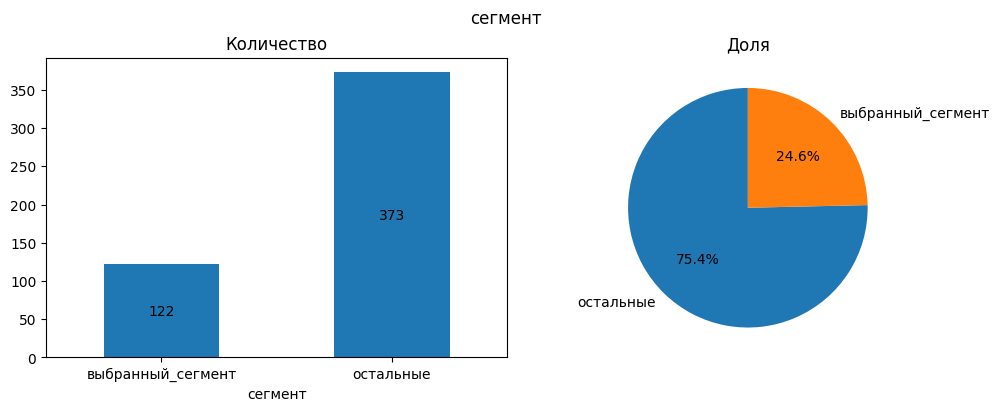

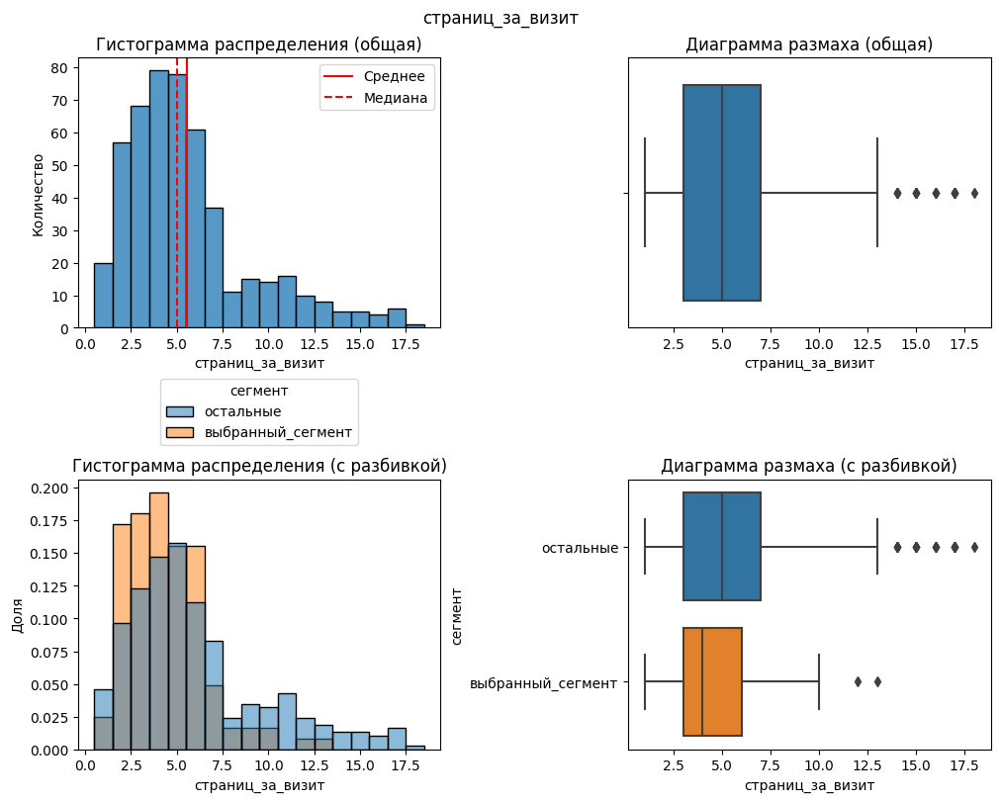

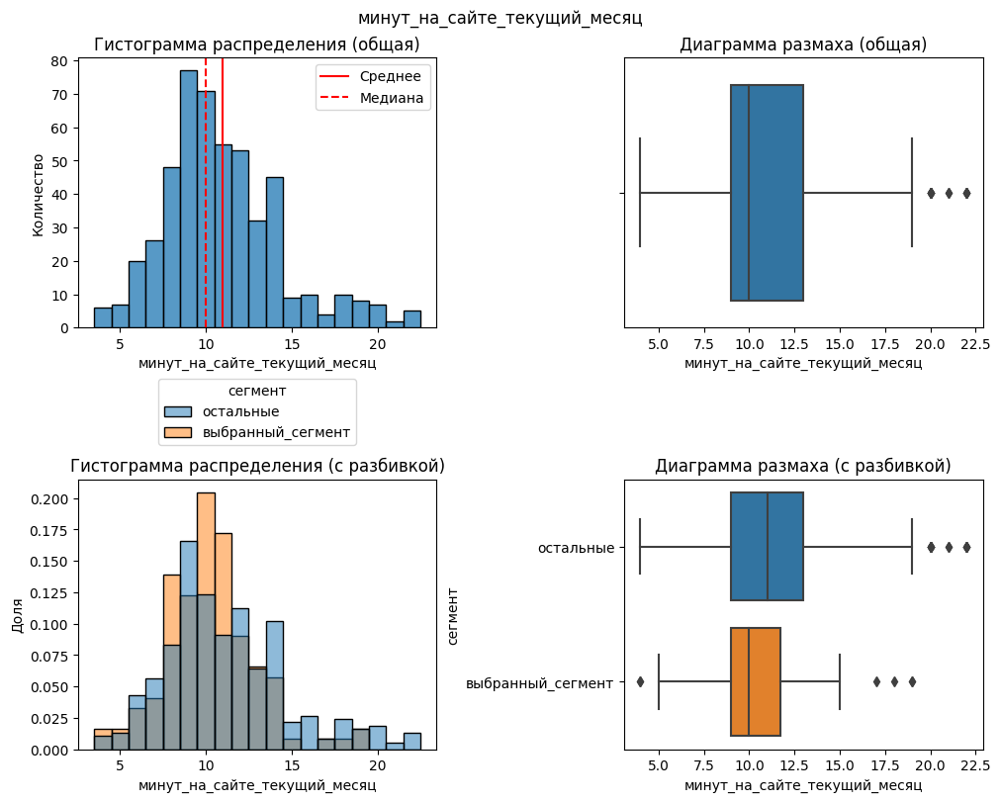

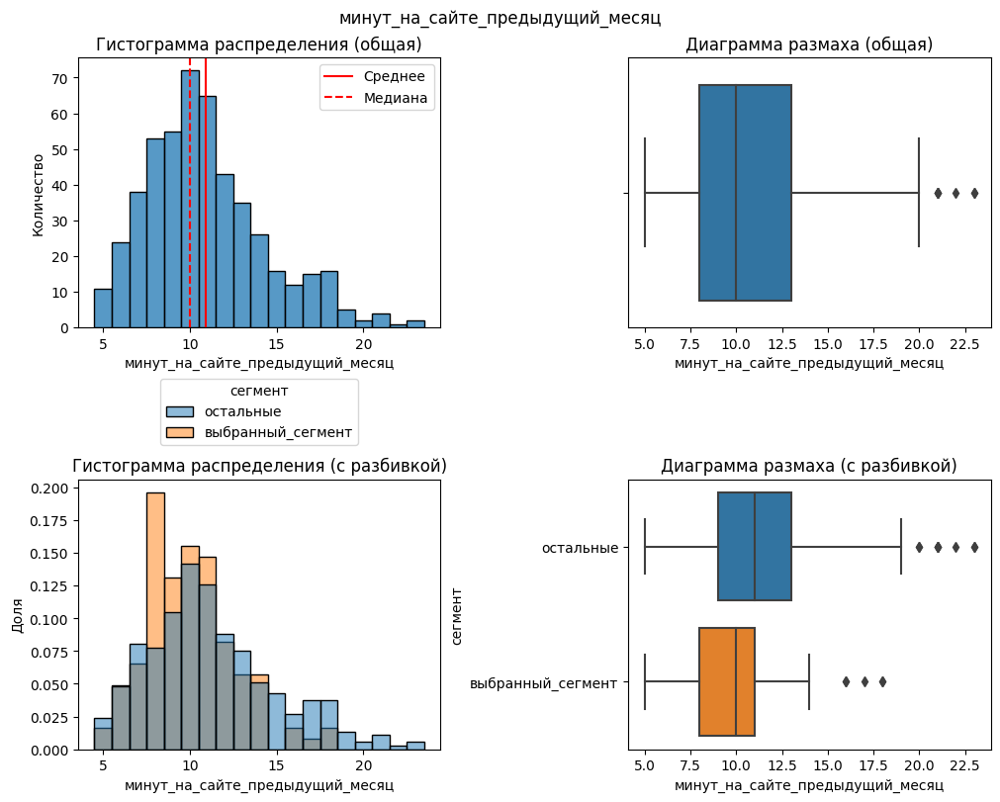

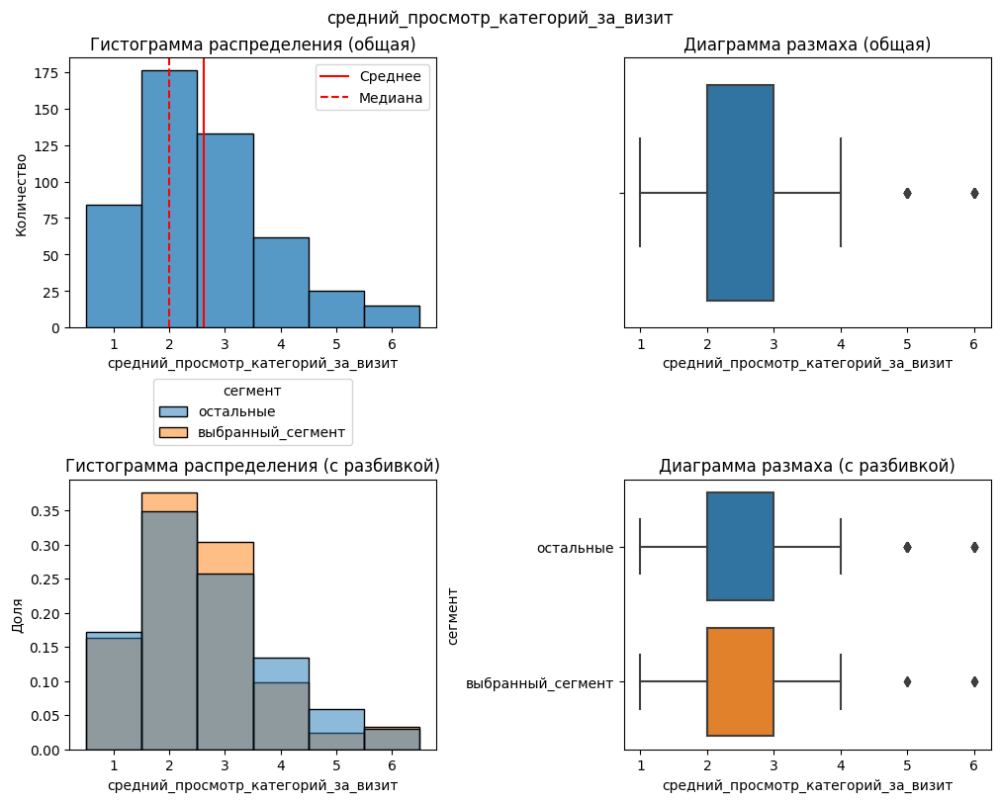

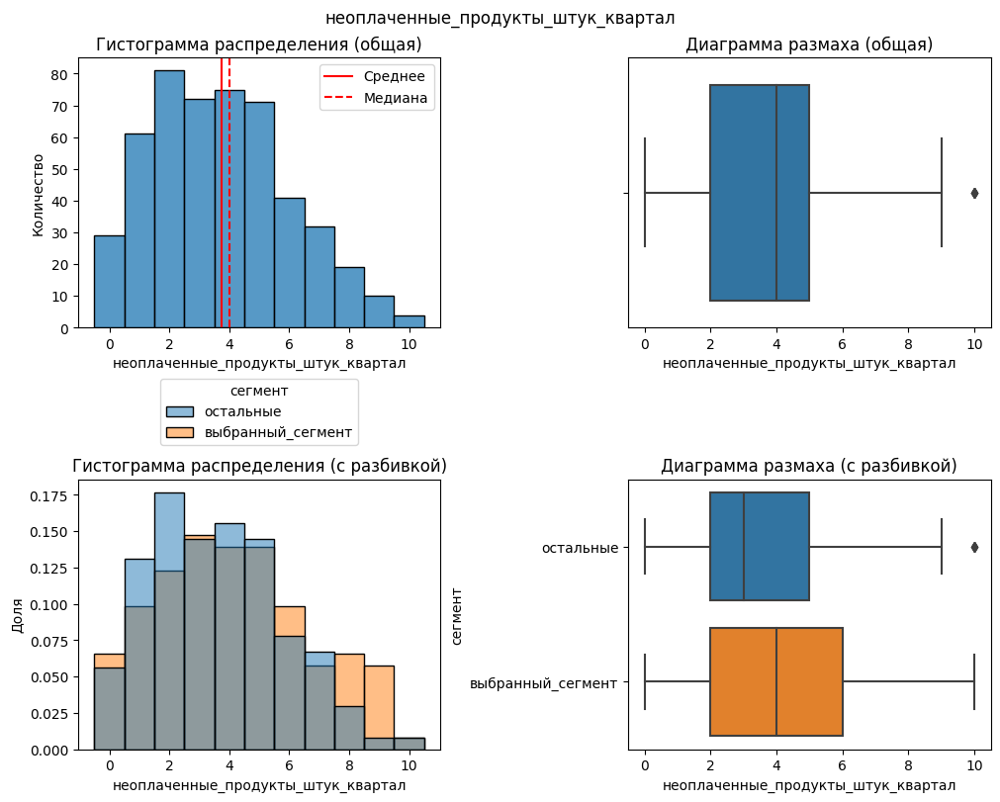

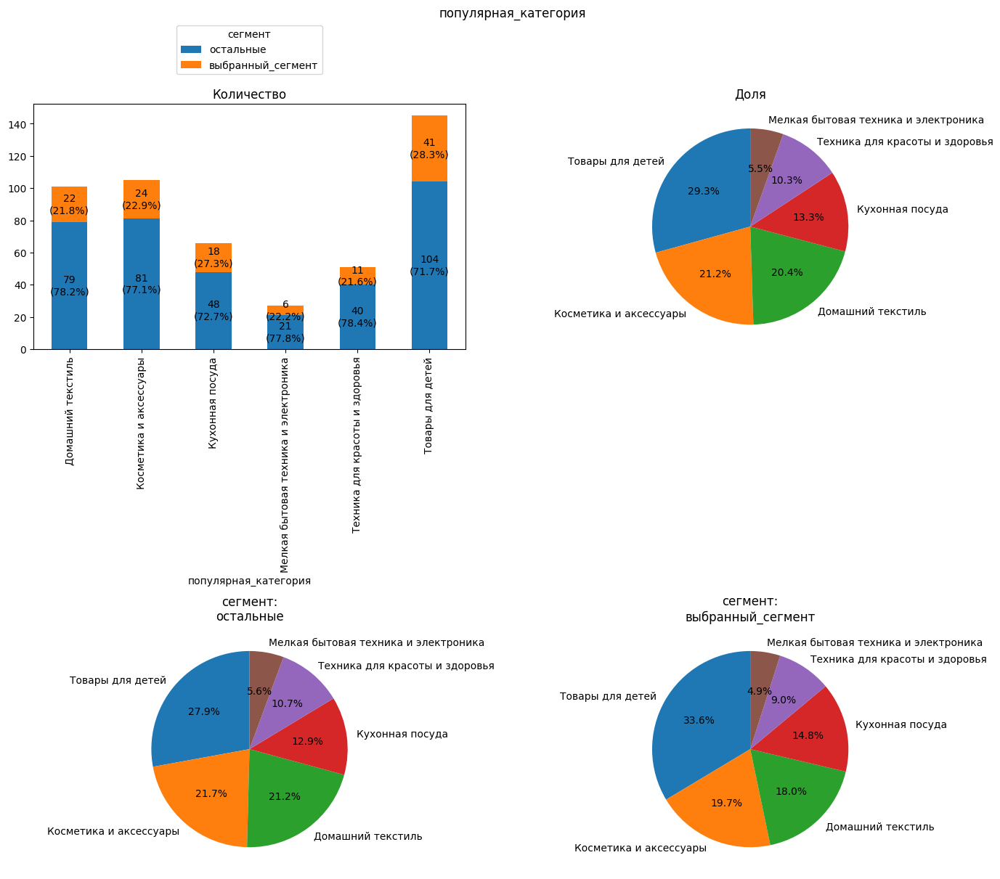

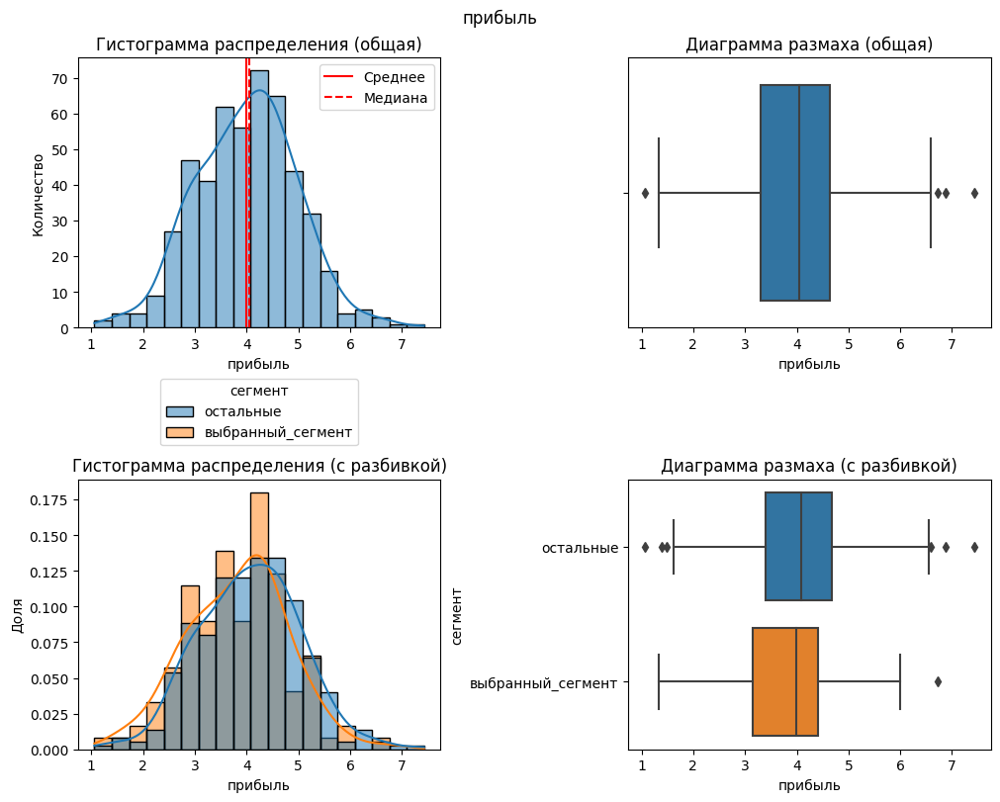

In [91]:
# список признаков для исследования выбранного сегмента
selected_features = [
    'сегмент',
    'страниц_за_визит',
    'минут_на_сайте_текущий_месяц',
    'минут_на_сайте_предыдущий_месяц',
    'средний_просмотр_категорий_за_визит',
    'неоплаченные_продукты_штук_квартал',
    'популярная_категория',
    'прибыль',
]
# строим графики для каждого признака в таблице
for feature in selected_features:
    stat_plots(market_lower, feature, target='сегмент')

**Результаты анализа выбранного сегмента:**

- К выбранному сегменту относятся 122 из 495 покупателей с покупательской активностью не менее трёх месяцев, активность которых снизилась, что составляет ≈25%.

- Покупатели выбранного сегмента в среднем за визит в течение 3-х последних месяцев просматривали меньше страниц сайта. Больше 10 страниц практически никто не смотрел, в то время как остальные просматривали и более 15 страниц.

- По времени, проведённом на сайте за 2 последних месяца, похожая картина: существенно меньше доля долгих визитов, продолжительность визита сильнее группируется вокруг среднего значения порядка 10 минут.

- Большое среднее количество просмотренных категорий товаров за визит тоже встречается реже, чем у остальных.

- В среднем больше неоплаченных товаров в корзине, и намного чаще встречается большое их количество (8-9 штук).

- Намного более популярна категория "Товары для детей" (≈34% по сравнению с общим уровнем 29%), немного более популярна категория "Кухонная посуда" (15% по сранению с 13%), а категория "Мелкая бытовая техника и электроника" намного менее популярна, чем у остальных.

В целом складывается картина, что типичные покупатели выбранного сегмента — это скорее всего женщины с детьми, которые покупают по акции в основном товары для детей и чаще покупают кухонную посуду, чем остальные покупатели. У них нет времени сидеть на сайте, а понравившиеся товары откладывают в корзину на потом, ожидая акций на них.

Вопреки представлению, что акционные покупатели малоприбыльны, распределение по прибыльности покупателей выбранного сегмента лишь незначительно смещено в сторону меньших значений относительно остальных. Это также повод задуматься о том, чтобы повысить прибыльность выбранного сегмента с помощью персонализированных предложений.

**Рекомендации по работе с сегментом для увеличения покупательской активности:**
- Чтобы удерживать активность сегмента, следует чаще устраивать маркетинговые акции в популярных у сегмента категориях, особенно в категории "Товары для детей". Это не обязательно скидки, а может быть более активная реклама, которая будет стимулировать покупателей чаще заходить на сайт и просматривать больше товаров.
- Полезно было бы напоминать покупателям об отложенных товарах в корзине, например, если они (или аналогичные товары) участвуют в акции.

Кроме того, остаются в силе общие рекомендации, относящиеся не только к выбранному сегменту:
- Предлагать на страницах сайта больше похожих или связанных товаров. Чем больше количество просмотренных страниц и категорий и время, проведённое на сайте, тем меньше вероятность снижения покупательской активности.
- Увеличить частоту маркетинговых коммуникаций, чтобы стимулировать покупателей чаще заходить на сайт и проводить на нём больше времени.

#### Разработка персонализированных предложений для сегмента

Чтобы разработать персонализированные предложения для выбранного сегмента, проанализируем прибыльность различных категорий товаров у покупателей выбранного сегмента в сравнении с остальными и с общим уровнем для всех покупателей, активность которых снизилась.

сегмент,выбранный_сегмент,остальные,все
популярная_категория,,,
Домашний текстиль,3.939,3.813,3.840
Косметика и аксессуары,3.596,4.252,4.102
Кухонная посуда,3.722,4.027,3.944
Мелкая бытовая техника и электроника,3.390,4.147,3.979
Техника для красоты и здоровья,4.018,3.903,3.928
Товары для детей,3.950,4.153,4.095
все,3.823,4.059,4.001


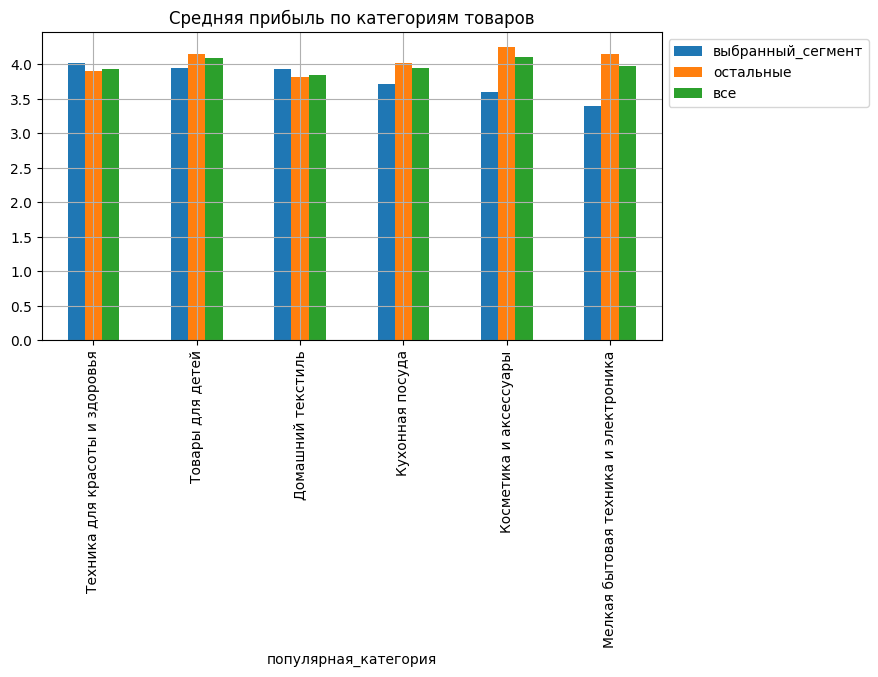

In [92]:
# формируем сводную таблицу со значениями средней прибыли
# по категориям товаров для сегментов
pivot = (
    market_lower
    .pivot_table(
        index='популярная_категория', 
        columns='сегмент', 
        values='прибыль',
        margins=True,
        margins_name='все'
    )
)
# выводим сводную таблицу
display(pivot.round(3))
# строим столбчатую диаграмму
(pivot
 .drop('все')
 .sort_values(by='выбранный_сегмент', ascending=False)
 .plot.bar(figsize=(8, 4))
)
# оформляем диаграмму
plt.title('Средняя прибыль по категориям товаров')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1));

Есть две категории, в которых выбранный сегмент приносит больше прибыли, чем остальные: "**Техника для красоты и здоровья**" и "**Домашний текстиль**". При этом популярность этих категорий в выбранном сегменте примерно соответствует общему уровню.

Поэтому имеет смысл предлагать покупателям выбранного сегмента в качестве **персональных рекомендаций** преимущественно товары из этих категорий, в первую очередь из категории "Техника для красоты и здоровья", как наиболее прибыльной в сегменте.

### Выводы

1. На основании анализа совместного распределения вероятности снижения покупательской активности и признака `акционные_покупки`, характеризущего продуктовое поведение покупателей, который является одним из наиболее значимых для прогнозирующей модели, выделен **сегмент покупателей** с максимальной долей акционных покупок (> 0.85) и высокой вероятностью снижения покупательской активности (> 0.8). 
    - Несмотря на небольшую долю выбранного сегмента (≈25%) среди покупателей с покупательской активностью не менее трёх месяцев, активность которых снизилась, для компактного сегмента можно подобрать более персонализированные предложения, которые помогут увеличить покупательскую активность и повысить прибыльность сегмента. 
    - Покупатели, которые следят за акциями, как правило более восприимчивы к маркетинговым коммуникациям, поэтому можно ожидать для выбранного сегмента хорошей конверсии персонализированных предложений в покупки.
    
2. Анализ выбранного сегмента по признакам, наиболее значимым для прогнозирующей модели, показал, что покупатели выбранного сегмента меньше просматривают сайт и держат много неоплаченных товаров в корзине. Наиболее популярные категории товаров — "Товары для детей" и "Кухонная посуда". Исходя из этого можно составить примерный **портрет типичного покупателя из выбранного сегмента** — это скорее всего женщины с детьми, которые покупают по акции в основном товары для детей. У них нет времени сидеть на сайте, а понравившиеся товары откладывают в корзину на потом, ожидая акций на них. При этом вопреки представлению, что акционные покупатели малоприбыльны, прибыльность покупателей выбранного сегмента лишь незначительно меньше среднего уровня. Это также лишний повод повысить прибыльность выбранного сегмента с помощью персонализированных предложений.

3. На основании результатов анализа характеристик выбранного сегмента можно сформулировать следующие **рекомендации по работе с сегментом для увеличения покупательской активности**:
    - Чаще устраивать маркетинговые акции в популярных у сегмента категориях, особенно в категории "Товары для детей". Это не обязательно скидки, а может быть более активная реклама, которая будет стимулировать покупателей чаще заходить на сайт и просматривать больше товаров.
    - Напоминать покупателям об отложенных товарах в корзине, например, если они (или аналогичные товары) участвуют в акции.
    - Стимулировать покупателей чаще заходить на сайт и проводить на нём больше времени, увеличив частоту маркетинговых коммуникаций, а также предлагая на страницах сайта больше похожих или связанных товаров. Эта общая рекомендация относится не только к выбранному сегменту, а в целом ко всем клиентам магазина.
    
4. В качестве **персональных рекомендаций** покупателям выбранного сегмента имеет смысл предлагать товары из категорий "**Техника для красоты и здоровья**" (наиболее прибыльная категория в сегменте) и "**Домашний текстиль**", в которых выбранный сегмент приносит больше прибыли, чем остальные покупатели. 

## Общий вывод

1. В проекте была поставлена **задача** разработать решение, которое позволит персонализировать предложения постоянным клиентам интернет-магазина, чтобы увеличить их покупательскую активность. В рамках данной задачи требовалось:
    - Подготовить и проанализировать имеющиеся данные о покупателях.
    - Построить модель, которая предскажет вероятность снижения покупательской активности клиента, и проанализировать значимость различных признаков для прогноза.
    - На основании результатов моделирования выделить сегмент покупателей, проанализировать его и дать рекомендации, как увеличить покупательскую активность сегмента, а также разработать для покупателей из этого сегмента персонализированные предложения.
    
2. **Исходные данные** представлены в четырёх таблицах:
    - Таблица `market_file` содержит данные о поведении на сайте, продуктовом поведении и о коммуникациях с покупателем для 1300 уникальных покупателях.
    - Таблица `market_money` содержит данные о выручке от каждого из этих покупателей за 3 последних месяца: текущий, предыдущий и предпредыдущий.
    - Таблица `market_time` содержит данные о времени в минутах, которое каждый из этих покупателей провёл на сайте за 2 последних месяца: текущий и предыдущий.
    - Таблица `money` содержит данные о среднемесячной прибыли каждого из этих покупателей за последние 3 месяца.

    Признаки, содержащиеся в данных, можно раздилить на 4 группы, которые характеризуют:<br/>
    - коммуникацию компании с клиентом,
    - продуктовое поведение покупателя (самая популярная категория, доля акционных покупок и т.п.)
    - финансовое поведение клиента (выручку от покупателя),
    - поведение покупателя на сайте (как много страниц просматривает и сколько времени проводит на сайте).

3. В результате **предобработки данных**:
    - Исправлены опечатки в текстовых значениях, тем самым устранены неявные дубликаты значений.
    - Выполнена проверка на пропуски и дубликаты записей.

4. На этапе **исследовательского анализа**:
    - Обнаружена и устранена аномалия в данных о выручке (чрезвычайно большое значение выручки от одного покупателя за текущий месяц). Аномальное значение заменено на медианное значение выручки остальных покупателей за текущий месяц.
    - Установлен факт дисбаланса данных по целевому признаку, однако степень дисбаланса умеренная (доля минорного класса 38%), поэтому данных минорного класса должно быть достаточно для обучения моделей.
    - Проанализировано распределение покупателей по количественным и категориальным признакам, представленным в данных, с учётом разбивки по значению целевого признака.
    - Отобраны покупатели с покупательской активностью не менее трёх месяцев, то есть такие, которые что-либо покупали в каждом из последних 3 месяцев.
    
5. На этапе **корреляционного анализа** выполнена проверка входных признаков на мультиколлинеарность. Принято решение использовать при обучении моделей помимо значения выручки за текущий месяц признаки, показывающие разницу в выручке между месяцами, чтобы избежать потенциальных проблем с мультиколлинеарностью признаков, а также поскольку они будут более информативны при анализе их влияния на целевой признак.

6. **Поиск лучшей модели**, предсказывающей вероятность снижения покупательской активности, выполнен путём подбора оптимальных значений гиперпараметров для моделей четырёх классов (`LogisticRegression`, `KNeighborsClassifier`, `DecisionTreeClassifier` и `SVC`) методом перебора по сетке с помощью инструмента `GridSearchCV`. При этом класс модели, тип скейлера и количество входных признаков тоже подбирались как гиперпараметры лучшей модели. Для лучшего учёта дисбаланса классов в моделях `LogisticRegression` и `SVC` использовано взвешивание классов.
    - Для сравнения качества моделей при подборе гиперпараметров и выборе лучшей модели использована метрика **ROC-AUC**, потому что эта метрика лучше всего подходит в рассматриваемой задаче предсказания вероятности снижения покупательской активности, т.к. позволяет оценить качество модели вне зависимости от выбранного порога классификации и не чувствительна к дисбалансу классов.
    - Подготовка данных для обучения моделей организована внутри пайплайна: заполнение пропусков, кодирование категориальных признаков, масштабирование количественных, отбор значимых признаков. Для удаления признаков с низкой значимостью использован селектор признаков `SelectKBest`.
    
7. **Лучшая модель** с максимальной метрикой ROC-AUC на кросс-валидации — это модель опорных векторов SVC с параметром силы регуляризации C = 1 (значение по умолчанию) и взвешиванием классов, обученная на данных с 18 признаками (16 исходных признаков, за исключением `разрешить_сообщать` и `маркет_актив_тек_мес`, а признак `популярная_категория` преобразуется в 5 бинарных признаков при кодировании), из которых все количественные масштабированы стандартизацией.
    - Метрика ROC-AUC лучшей модели на тренировочной выборке при кросс-валидации: 0.9166, на тестовой выборке даже немного выше: 0.9197. Это хорошо — значит, модель не переобучилась.
    - Матрица ошибок лучшей модели на тестовой выборке показывает, что модель допускает больше ошибок типа False Negative, т.е. для неё Precision > Recall. Но соотношение Precision/Recall можно в дальнейшем при необходимости настроить подбором порога классификации.  
    
8. **Анализ важности признаков** для лучшей модели показал:
    - Мало значимы признаки, характеризующие коммуникацию с клиентом. Это указывает на то, что текущая стратегия маркетинговых коммуникаций с покупателями не эффективна.
    - Среднюю значимость имеют признаки, характеризующие финансовое поведение покупателя (выручку и её динамику). Причём положительная динамика выручки от покупателя за прошедший период приводит к снижению его активности в будущем. 
    - Сильнее всего на вероятность снижения покупательской активности влияют признаки, характеризующие поведение покупателя на сайте (малое количество просмотренных страниц и время, проведённое на сайте), а также признаки, характеризующие продуктовое поведение покупателя (высокая доля акционных покупок, количество просмотренных категорий товаров и большое количество неоплаченных товаров в корзине).

9. На основании результатов моделирования и анализа значимости признаков проведена сегментация покупателей. Выделен и проанализирован **сегмент покупателей** с максимальной долей акционных покупок и высокой вероятностью снижения покупательской активности. 
    - Примерный **портрет типичного покупателя** из выбранного сегмента — это скорее всего женщины с детьми, которые покупают по акции в основном товары для детей. У них нет времени сидеть на сайте, а понравившиеся товары откладывают в корзину на потом, ожидая акций на них.
    - Прибыльность акционных покупателей оказалась лишь незначительно меньше среднего уровня. Это также лишний повод повысить прибыльность выбранного сегмента с помощью персонализированных предложений.
    - Покупатели, которые следят за акциями, как правило более восприимчивы к маркетинговым коммуникациям, поэтому можно ожидать для выбранного сегмента хорошей конверсии персонализированных предложений в покупки.
    
10. На основании результатов анализа выбранного сегмента сформулированы **рекомендации по работе с сегментом для увеличения покупательской активности**:
    - Увеличить частоту маркетинговых коммуникаций по популярным у сегмента категориям товаров, особенно по категории "Товары для детей", а также предлагать на страницах сайта больше похожих или связанных товаров, чтобы стимулировать покупателей чаще заходить на сайт и проводить на нём больше времени.
    - Напоминать покупателям об отложенных товарах в корзине, например, если они (или аналогичные товары) участвуют в акции.
    - В качестве **персональных рекомендаций** покупателям выбранного сегмента выгоднее предлагать товары из категорий "**Техника для красоты и здоровья**" (наиболее прибыльная категория в сегменте) и "**Домашний текстиль**", в которых выбранный сегмент приносит больше прибыли, чем остальные покупатели. 